# Temperature Forecast Project using ML

Project Description
This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

Attribute Information:
For more information, read [Cho et al, 2020].
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T


In [159]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [160]:
#loading the dataset
url='https://raw.githubusercontent.com/dsrscientist/Dataset2/main/temperature.csv'
df=pd.read_csv(url)
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


# Explonatory Data Analysis (EDA)

In [161]:
# checking for dataset columns
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [162]:
# shape of the dataset
df.shape

(7752, 25)

In [163]:
# data tupes of dataset
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [164]:
# Basic Information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


From the basic information we can observe that 
1. There are 7752 entities inedxed from 0 to 7751. and 25 columns.
2. value of not null count is not same for every column. which refers to the presence of missing value.
3. The data type of Date column is object which refers to the string data. We need to convert that string data into datatime datatype.
4. Out of 25 columns only date column data is objective data type and all other column datatype is float data type.

In [165]:
# Changing date column from object type to Date type
df['Date'] = pd.to_datetime(df['Date'])

Now data type of Data column should be changed to datatime.

In [166]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7750 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7682 non-null   float64       
 3   Present_Tmin      7682 non-null   float64       
 4   LDAPS_RHmin       7677 non-null   float64       
 5   LDAPS_RHmax       7677 non-null   float64       
 6   LDAPS_Tmax_lapse  7677 non-null   float64       
 7   LDAPS_Tmin_lapse  7677 non-null   float64       
 8   LDAPS_WS          7677 non-null   float64       
 9   LDAPS_LH          7677 non-null   float64       
 10  LDAPS_CC1         7677 non-null   float64       
 11  LDAPS_CC2         7677 non-null   float64       
 12  LDAPS_CC3         7677 non-null   float64       
 13  LDAPS_CC4         7677 non-null   float64       
 14  LDAPS_PPT1        7677 n

hare we can see that data type of date column has changed to datetime.

In [167]:
# Checking for missing value
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

hare we can observe that the number of missing value present for each column. 

In [168]:
# checking the date missing value
df[df['Date'].isnull()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7750,NaN,NaT,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.370,0.098475,4329.520508,17.4,11.3
7751,NaN,NaT,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.335,5.178230,5992.895996,38.9,29.8


Hare we can see that the last 2 row data does not contain the date as well as station. then we can drop that row.

In [169]:
# Checking tailing values of the dataset 
df.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaT,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,NaN,NaT,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


as we are working with the dataset which last date is 30th,Aug 2017. then we can drop the last two data.

In [170]:
# droping last two data 
df.drop(index=[7750,7751], axis=0, inplace=True)

In [171]:
df.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7745,21.0,2017-08-30,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,...,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7746,22.0,2017-08-30,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,...,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.0,0.0,0.0,37.5237,126.970,19.5844,0.2713,4451.345215,27.8,17.4


now last two data has been removed.

station              0
Date                 0
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64


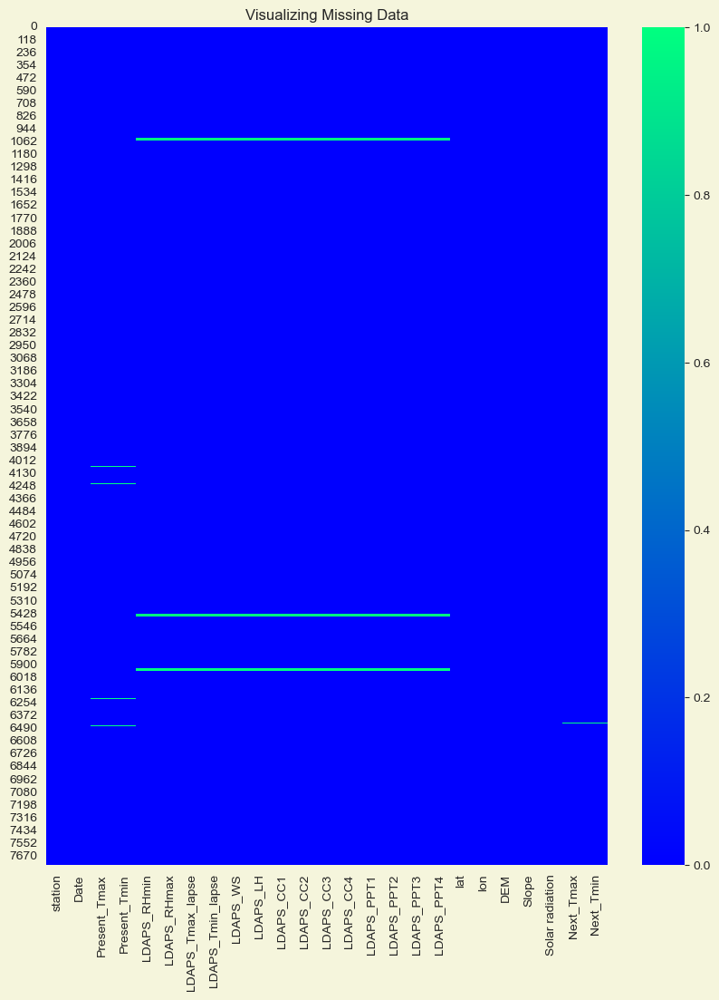

In [172]:
# looking for null value present
print(df.isnull().sum())
# visualizing missing values
plt.figure(figsize=(10,12),facecolor='beige')
sns.heatmap(df.isnull(), cmap='winter')
plt.title("Visualizing Missing Data")
plt.show()

From the heatmap we can see that all the missing values lies in the same row for different column. hence we can drop that row.

In [173]:
# dropping the missing value
df.dropna(axis=0, inplace=True)

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64


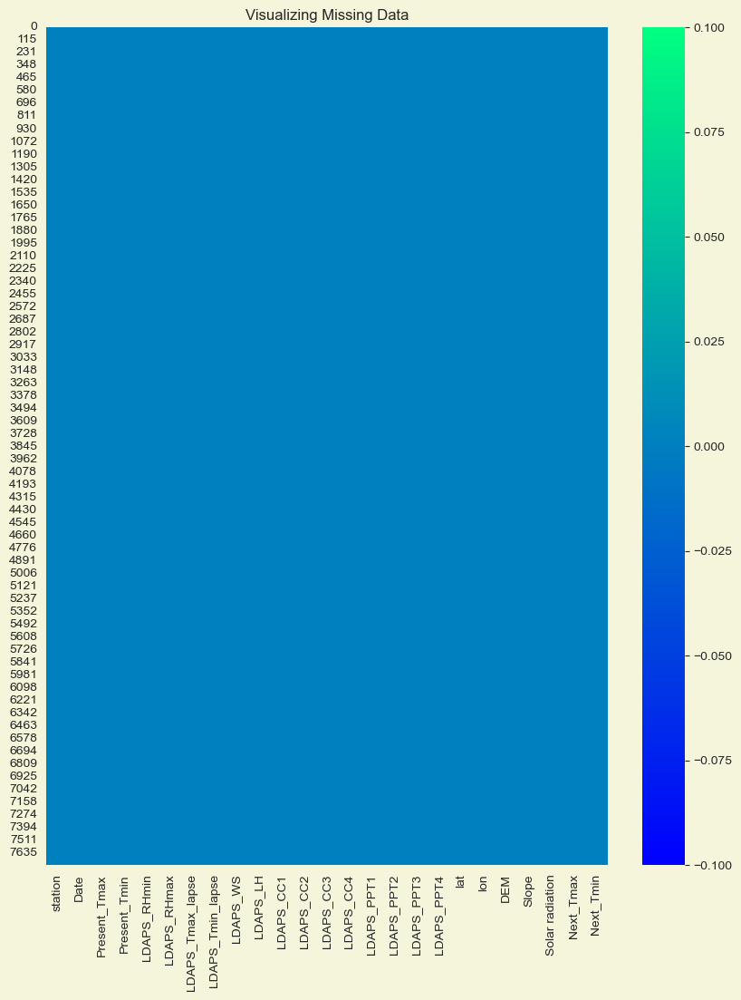

In [174]:
#now again looking for null value present
print(df.isnull().sum())
# visualizing missing values
plt.figure(figsize=(10,12),facecolor='beige')
sns.heatmap(df.isnull(), cmap='winter')
plt.title("Visualizing Missing Data")
plt.show()

missing value for each column has been removed.

In [175]:
# Extracting days and months from date column.
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

In [176]:
# Checking the no of unique value present
df.nunique()

station               25
Date                 307
Present_Tmax         167
Present_Tmin         155
LDAPS_RHmin         7585
LDAPS_RHmax         7577
LDAPS_Tmax_lapse    7588
LDAPS_Tmin_lapse    7588
LDAPS_WS            7588
LDAPS_LH            7588
LDAPS_CC1           7485
LDAPS_CC2           7496
LDAPS_CC3           7512
LDAPS_CC4           7438
LDAPS_PPT1          2779
LDAPS_PPT2          2479
LDAPS_PPT3          2326
LDAPS_PPT4          1892
lat                   12
lon                   25
DEM                   25
Slope                 25
Solar radiation     1575
Next_Tmax            181
Next_Tmin            157
Month                 12
Day                   21
dtype: int64

In [177]:
# looking for unique values
for i in df.columns:
    print(i)
    print(df[i].unique(),'\n')

station
[ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. 22. 23. 24. 25.] 

Date
['2013-06-30T00:00:00.000000000' '2013-01-07T00:00:00.000000000'
 '2013-02-07T00:00:00.000000000' '2013-03-07T00:00:00.000000000'
 '2013-04-07T00:00:00.000000000' '2013-05-07T00:00:00.000000000'
 '2013-06-07T00:00:00.000000000' '2013-07-07T00:00:00.000000000'
 '2013-08-07T00:00:00.000000000' '2013-09-07T00:00:00.000000000'
 '2013-10-07T00:00:00.000000000' '2013-11-07T00:00:00.000000000'
 '2013-12-07T00:00:00.000000000' '2013-07-13T00:00:00.000000000'
 '2013-07-14T00:00:00.000000000' '2013-07-15T00:00:00.000000000'
 '2013-07-16T00:00:00.000000000' '2013-07-17T00:00:00.000000000'
 '2013-07-18T00:00:00.000000000' '2013-07-19T00:00:00.000000000'
 '2013-07-20T00:00:00.000000000' '2013-07-21T00:00:00.000000000'
 '2013-07-22T00:00:00.000000000' '2013-07-23T00:00:00.000000000'
 '2013-07-24T00:00:00.000000000' '2013-07-25T00:00:00.000000000'
 '2013-07-26T00:00:00.000000000' '201

In [178]:
# looking for unique value with its countings
for i in df.columns:
    print(df[i].value_counts(),'\n')

25.0    307
10.0    307
23.0    307
18.0    307
17.0    307
2.0     307
3.0     306
4.0     306
13.0    305
16.0    304
20.0    304
21.0    304
14.0    303
1.0     303
9.0     302
12.0    302
15.0    302
19.0    302
22.0    302
24.0    302
11.0    301
7.0     301
6.0     301
8.0     300
5.0     296
Name: station, dtype: int64 

2013-06-30    25
2016-07-23    25
2015-08-22    25
2015-08-23    25
2015-08-24    25
              ..
2015-08-13    22
2015-07-24    22
2017-06-07    22
2017-08-23    22
2017-06-30    16
Name: Date, Length: 307, dtype: int64 

31.4    112
29.4    108
29.1    106
29.2    105
30.6    105
       ... 
21.2      1
20.1      1
36.4      1
20.3      1
20.0      1
Name: Present_Tmax, Length: 167, dtype: int64 

24.0    160
23.8    153
23.5    143
23.1    143
23.3    140
       ... 
14.3      1
29.9      1
29.7      1
29.1      1
15.0      1
Name: Present_Tmin, Length: 155, dtype: int64 

77.030350    2
51.810596    2
71.658089    2
58.255688    1
46.582764    1
        

from the no of unique value , unique value for each Column, and value_counts operation we can canclude that 
1. The number of unique value for Date column is 307. which means we have records of 307 days data for different column.
2. The  no of count for longitude column  is also same as the no of unique value of date.
3. The no of unique value for the sattion is same as the no of unique value for the longitude column.
4. From the value count we can observe that there are huge no of count for the value 0 in the column LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3, LDAPS_PPT4.

In [179]:
# Checking statistical summary
df.describe().T

,count,mean,std,min,25%,50%,75%,max
station,7588.0,13.014101,7.217858,1.000000,7.000000,13.000000,19.000000,25.000000
Present_Tmax,7588.0,29.748366,2.967401,20.000000,27.800000,29.900000,32.000000,37.600000
Present_Tmin,7588.0,23.195809,2.400880,11.300000,21.600000,23.400000,24.800000,29.900000
LDAPS_RHmin,7588.0,56.724969,14.626559,19.794666,45.960243,55.023199,67.115099,98.524734
LDAPS_RHmax,7588.0,88.360823,7.199456,58.936283,84.203724,89.784122,93.742725,100.000153
LDAPS_Tmax_lapse,7588.0,29.620128,2.943496,17.624954,27.673756,29.709537,31.711109,38.542255
LDAPS_Tmin_lapse,7588.0,23.511786,2.342579,14.272646,22.086820,23.758249,25.155660,29.619342
LDAPS_WS,7588.0,7.094097,2.177034,2.882580,5.675358,6.547838,8.028960,21.857621
LDAPS_LH,7588.0,62.492606,33.686158,-13.603212,37.206201,56.898324,84.235666,213.414006
LDAPS_CC1,7588.0,0.368510,0.262260,0.000000,0.146546,0.315706,0.574174,0.967277


Observations:
1. Count for each column is same for each column. which confirms no missing value present in the dataset.
2. Mean is greater than median in LDAPS_LH, LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3, LDAPS_PPT4, DEM columns which refers to the right tailed skewness of those columns. We need to eleminate those skewness utilizing power transformation. except these columns data are normally distributed.
3. Minimum value for 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4' columns is zero. and if we check the value for the standard deviation value and difference between minimum value and 25th percentile value, similarly difference between 25th and 50th, difference between 50th and 75th and finally the difference between 75th and maximum value. we can confirm there there are huge outliers present in the dataset.


## Data Visualisation

#### Univariate Analysis

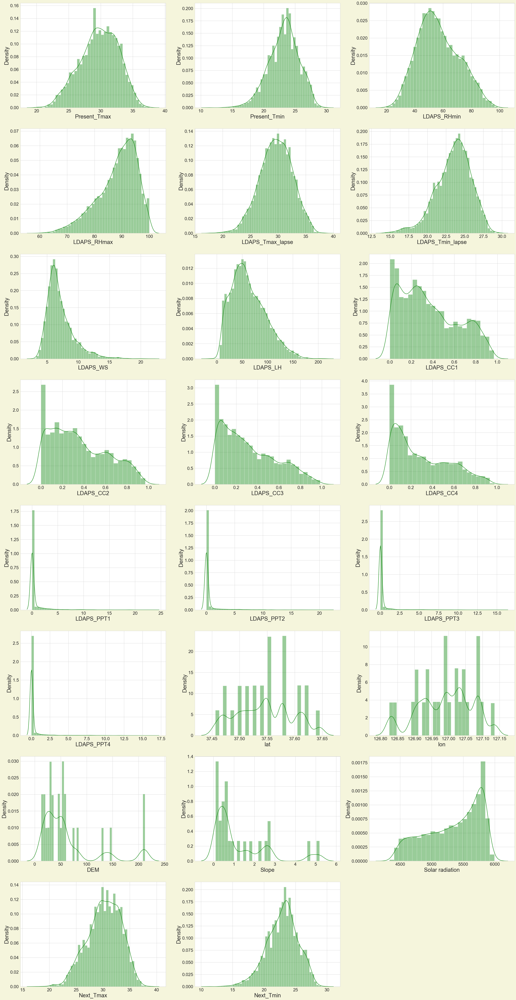

In [180]:
# Checking distribution of data for numerical columns
columns=['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
         'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
         'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
         'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
         'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin']

row=int(np.ceil(len(columns)/3))
plt.figure(figsize=(row*5,80), facecolor='beige')
pltno=1
for col in columns:
    if pltno<25:
        plt.subplot(row, 3, pltno)
        sns.distplot(df[col], hist=True, kde=True, color='green')
        plt.xticks(fontsize=20)
        plt.yticks(fontsize=20)
        plt.xlabel(col, fontsize=25)
        plt.ylabel("Density", fontsize=25)
    pltno+=1
plt.show()

from the univariate analysis we can see that allmost every column is nornally distributed except 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', Solar radiation columns.

### Bibariate analysis

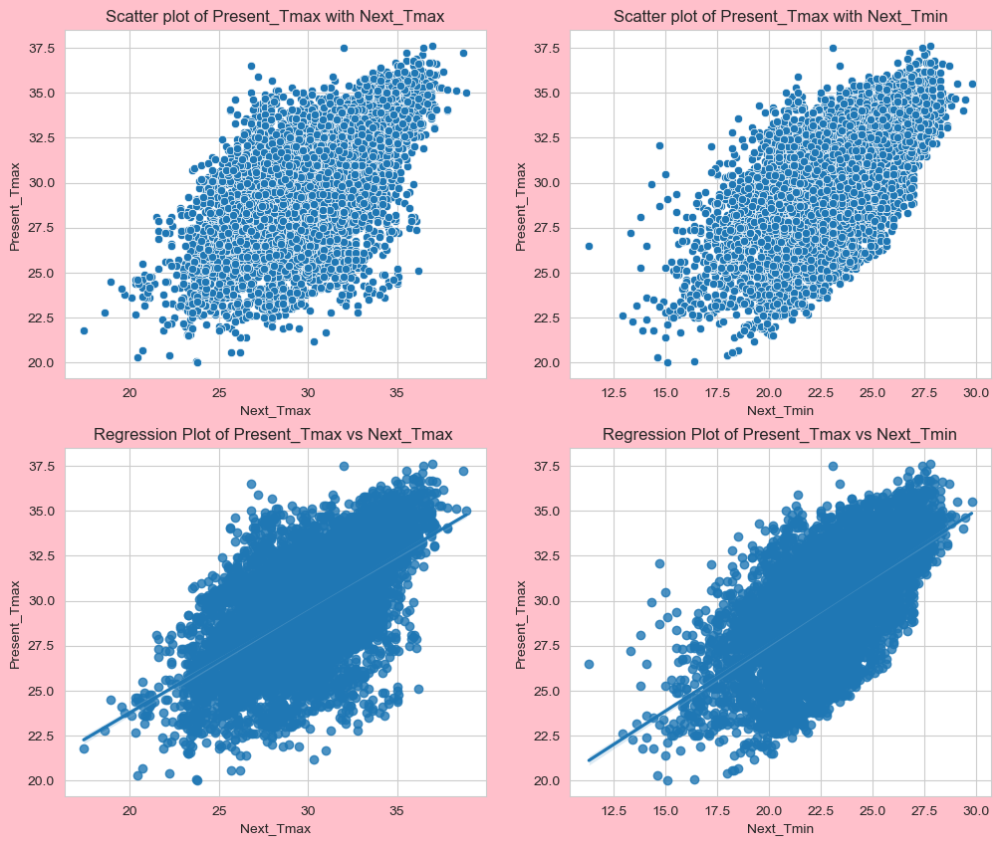

In [181]:
# looking catter plot and regression plot fot Present_Tmax with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='Present_Tmax', palette='dark')
plt.title("Scatter plot of Present_Tmax with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='Present_Tmax', palette='winter')
plt.title("Scatter plot of Present_Tmax with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='Present_Tmax')
plt.title("Regression Plot of Present_Tmax vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='Present_Tmax')
plt.title("Regression Plot of Present_Tmax vs Next_Tmin")
plt.show()

Scatterplot and regression plot shows that their is strong positive relation between them.

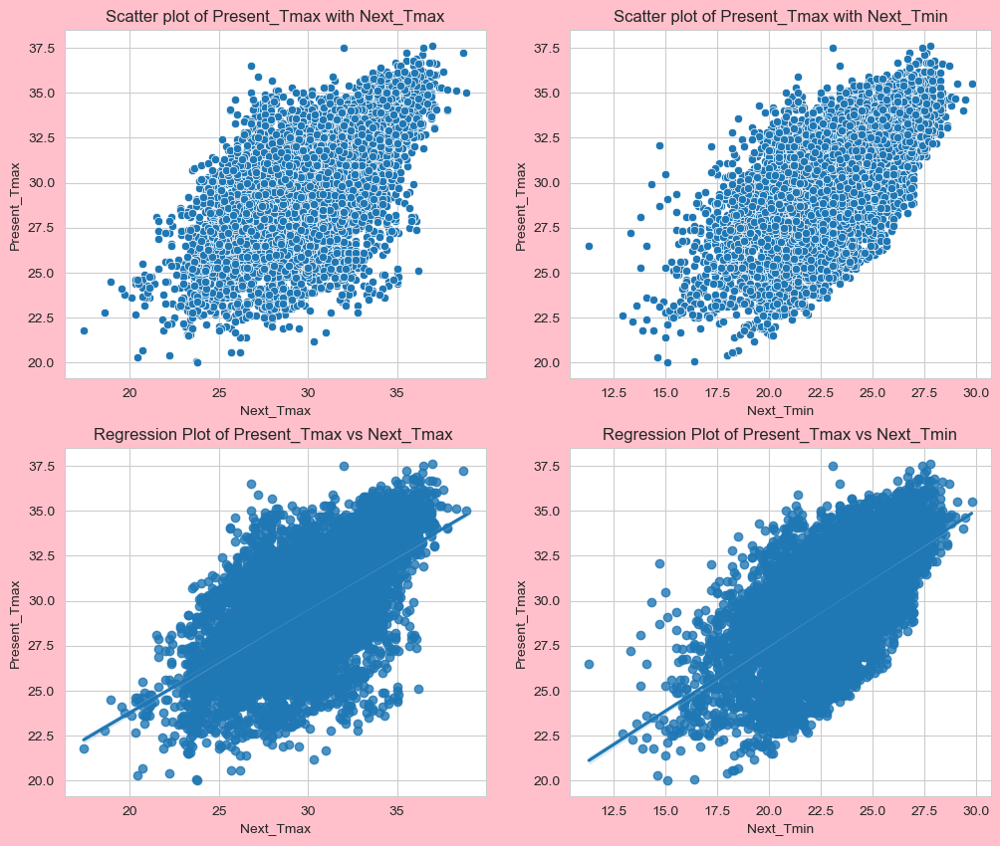

In [182]:
# looking catter plot and regression plot fot Present_Tmax with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='Present_Tmax', palette='dark')
plt.title("Scatter plot of Present_Tmax with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='Present_Tmax', palette='winter')
plt.title("Scatter plot of Present_Tmax with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='Present_Tmax')
plt.title("Regression Plot of Present_Tmax vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='Present_Tmax')
plt.title("Regression Plot of Present_Tmax vs Next_Tmin")
plt.show()

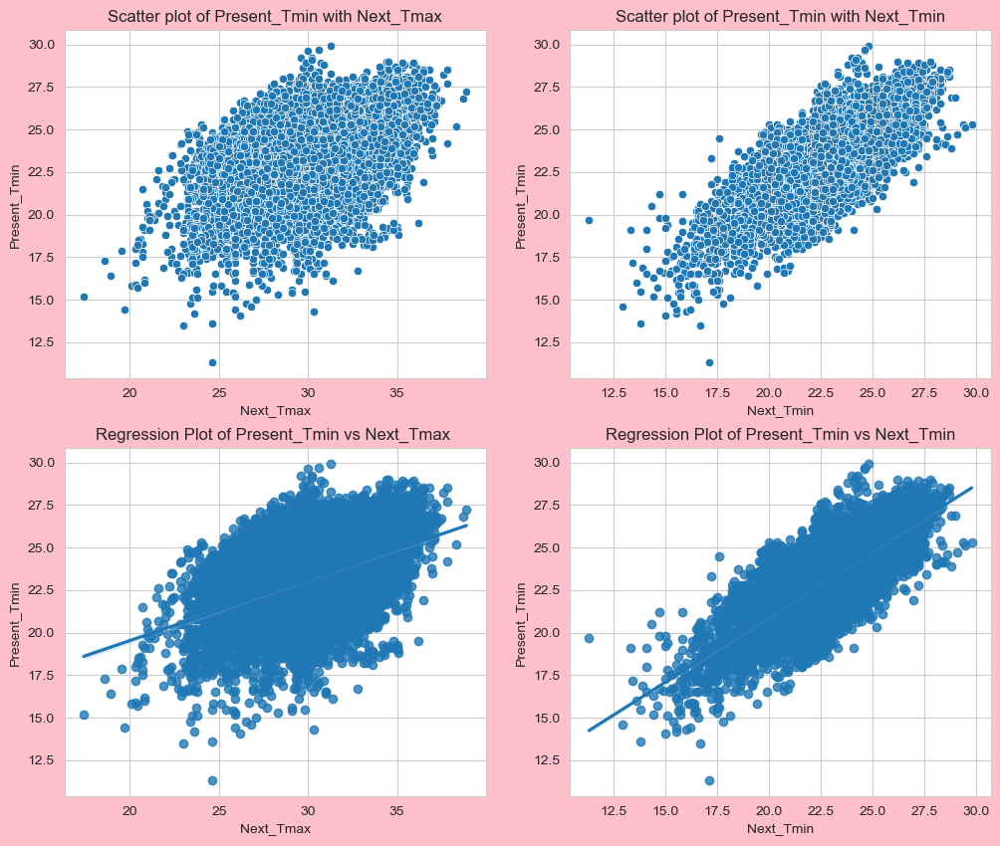

In [183]:
# looking catter plot and regression plot fot Present_Tmin with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='Present_Tmin', palette='dark')
plt.title("Scatter plot of Present_Tmin with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='Present_Tmin', palette='winter')
plt.title("Scatter plot of Present_Tmin with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='Present_Tmin')
plt.title("Regression Plot of Present_Tmin vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='Present_Tmin')
plt.title("Regression Plot of Present_Tmin vs Next_Tmin")
plt.show()

There is strong positive relation between Present_Tmim and Next_Tmin column and the slope of the Present_Tmin vs Next_Tmax is comparetively less which refers to the modarate correlation between them.

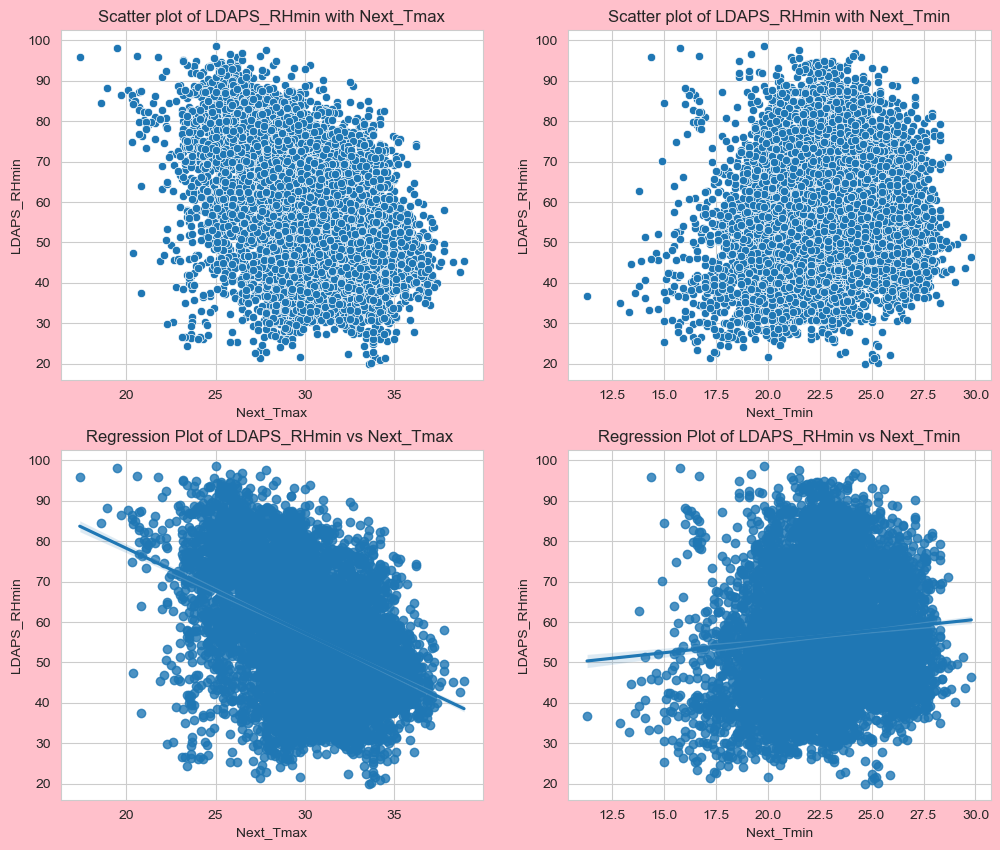

In [184]:
# looking catter plot and regression plot fot LDAPS_RHmin with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_RHmin', palette='dark')
plt.title("Scatter plot of LDAPS_RHmin with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_RHmin', palette='winter')
plt.title("Scatter plot of LDAPS_RHmin with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_RHmin')
plt.title("Regression Plot of LDAPS_RHmin vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_RHmin')
plt.title("Regression Plot of LDAPS_RHmin vs Next_Tmin")
plt.show()

There is  strongly negative correlation between LDAPS_RHmin and Next_Tmax column and no relation between LDAPS_RHmin Next_Tmin.

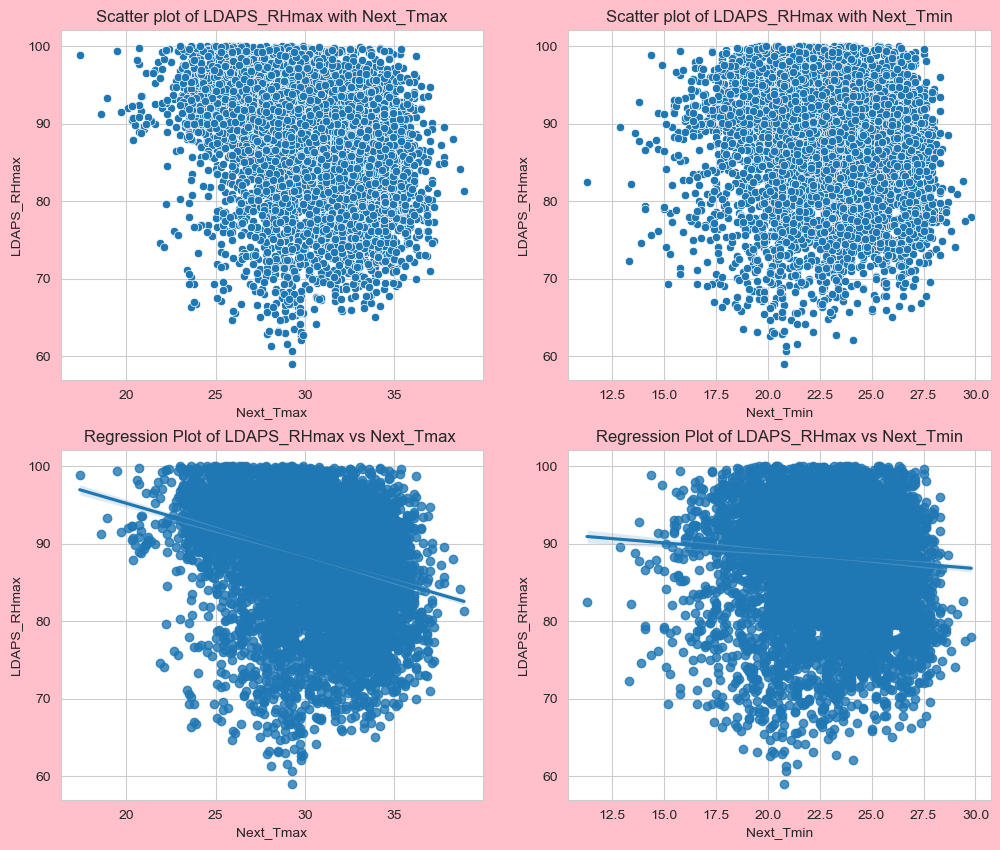

In [185]:
# looking catter plot and regression plot fot LDAPS_RHmax with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_RHmax', palette='dark')
plt.title("Scatter plot of LDAPS_RHmax with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_RHmax', palette='winter')
plt.title("Scatter plot of LDAPS_RHmax with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_RHmax')
plt.title("Regression Plot of LDAPS_RHmax vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_RHmax')
plt.title("Regression Plot of LDAPS_RHmax vs Next_Tmin")
plt.show()

for both the target variable LDAPS_RHmax is negatively corellated.

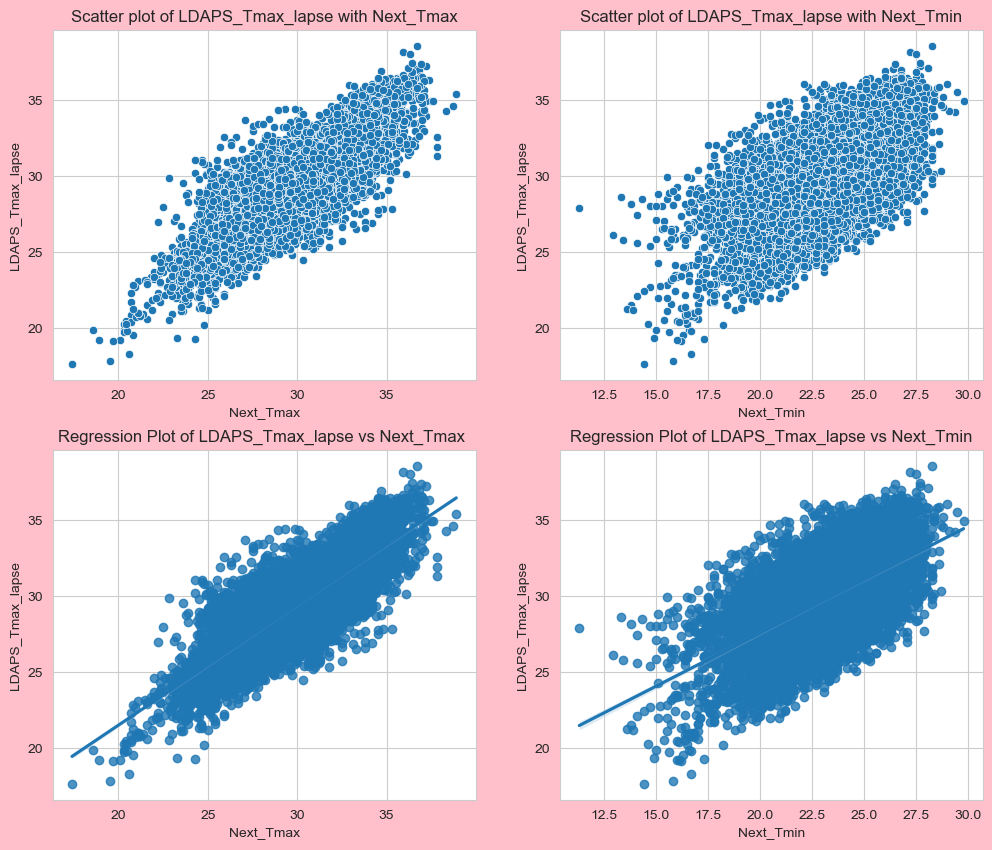

In [186]:
# looking catter plot and regression plot fot LDAPS_Tmax_lapse with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_Tmax_lapse', palette='dark')
plt.title("Scatter plot of LDAPS_Tmax_lapse with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_Tmax_lapse', palette='winter')
plt.title("Scatter plot of LDAPS_Tmax_lapse with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_Tmax_lapse')
plt.title("Regression Plot of LDAPS_Tmax_lapse vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_Tmax_lapse')
plt.title("Regression Plot of LDAPS_Tmax_lapse vs Next_Tmin")
plt.show()

There is strongly positive relation for the LDAPS_Tmax_lapse with both the target variable.

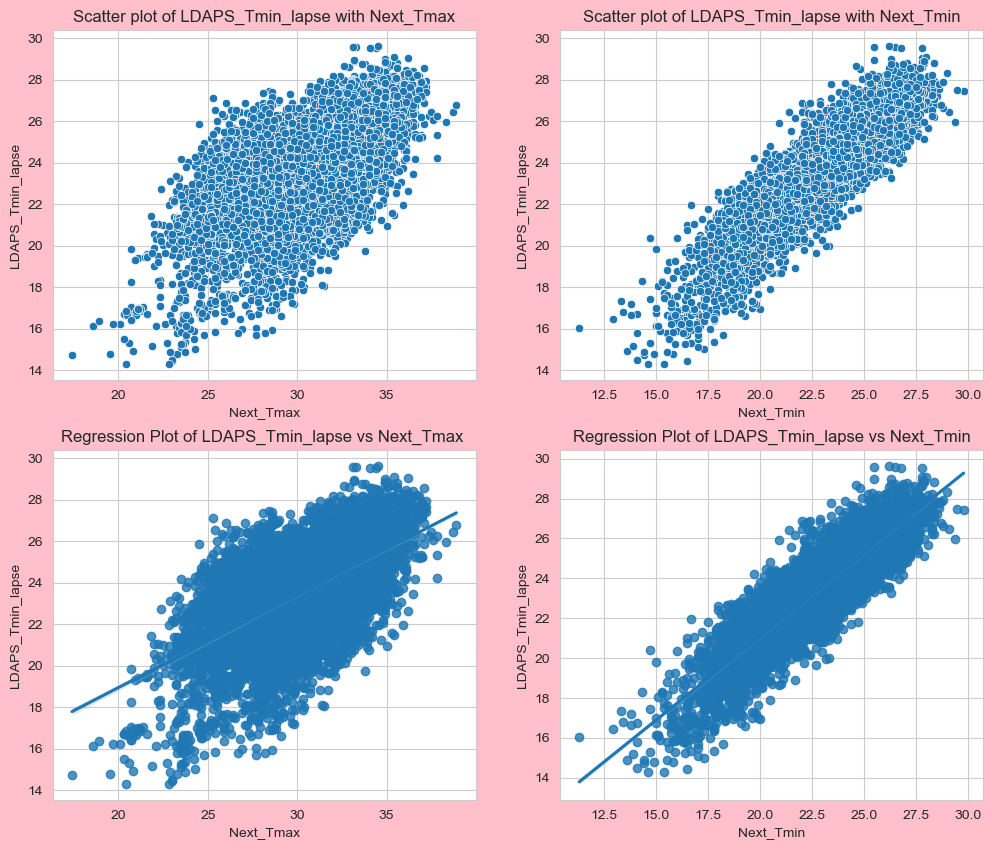

In [187]:
# looking catter plot and regression plot fot LDAPS_Tmin_lapse with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_Tmin_lapse', palette='dark')
plt.title("Scatter plot of LDAPS_Tmin_lapse with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_Tmin_lapse', palette='winter')
plt.title("Scatter plot of LDAPS_Tmin_lapse with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_Tmin_lapse')
plt.title("Regression Plot of LDAPS_Tmin_lapse vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_Tmin_lapse')
plt.title("Regression Plot of LDAPS_Tmin_lapse vs Next_Tmin")
plt.show()

There is strongly positive relation for the column LDAPS_Tmin_lapse with both the target variable.

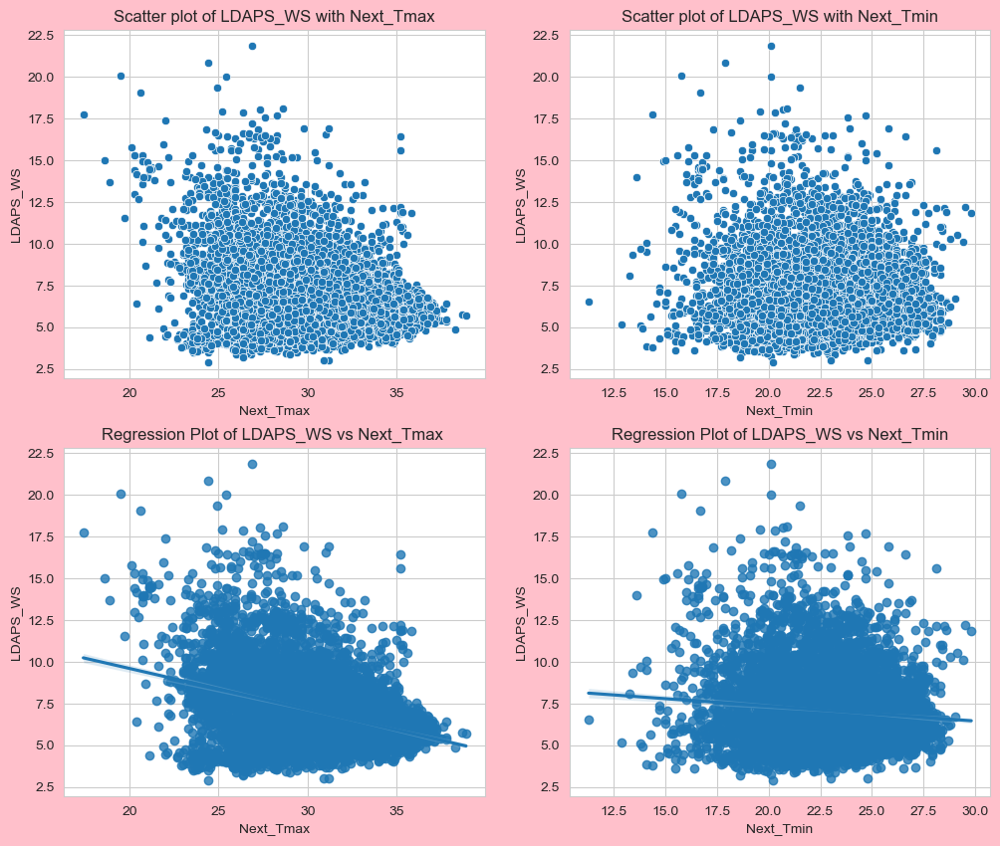

In [188]:
# looking catter plot and regression plot fot LDAPS_WS with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_WS', palette='dark')
plt.title("Scatter plot of LDAPS_WS with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_WS', palette='winter')
plt.title("Scatter plot of LDAPS_WS with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_WS')
plt.title("Regression Plot of LDAPS_WS vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_WS')
plt.title("Regression Plot of LDAPS_WS vs Next_Tmin")
plt.show()

There is slightly negative relation for the column LDAPS_WS with both the target variable.

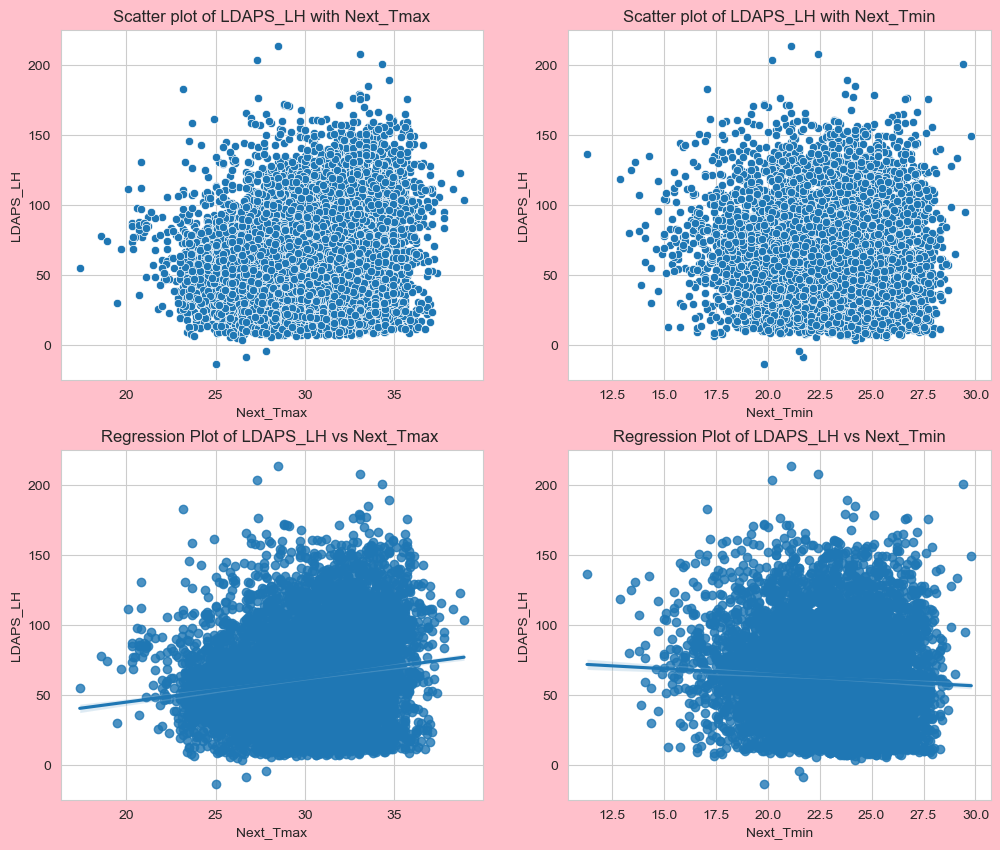

In [189]:
# looking catter plot and regression plot fot LDAPS_LH with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_LH', palette='dark')
plt.title("Scatter plot of LDAPS_LH with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_LH', palette='winter')
plt.title("Scatter plot of LDAPS_LH with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_LH')
plt.title("Regression Plot of LDAPS_LH vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_LH')
plt.title("Regression Plot of LDAPS_LH vs Next_Tmin")
plt.show()

There is slight positive relation between LDAPS_LH and Next_Tmax and slighty negative relation between LDAPS_LH with Next_Tmin.

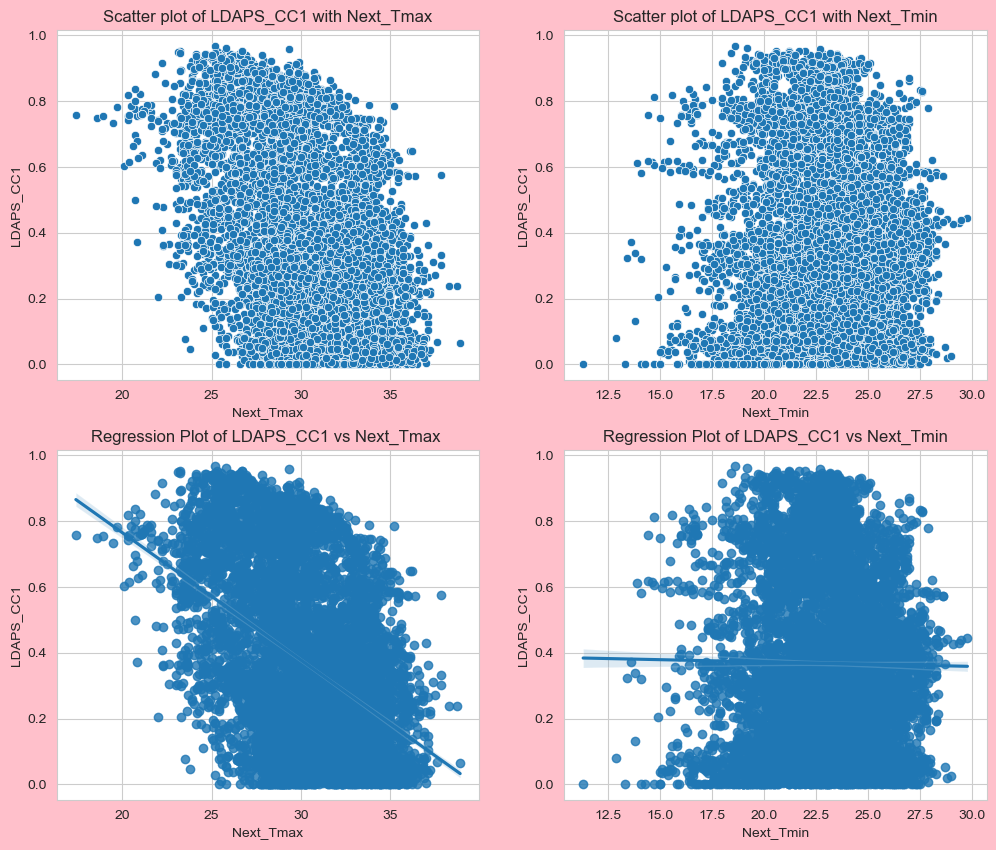

In [190]:
# looking catter plot and regression plot fot LDAPS_CC1 with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_CC1', palette='dark')
plt.title("Scatter plot of LDAPS_CC1 with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_CC1', palette='winter')
plt.title("Scatter plot of LDAPS_CC1 with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_CC1')
plt.title("Regression Plot of LDAPS_CC1 vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_CC1')
plt.title("Regression Plot of LDAPS_CC1 vs Next_Tmin")
plt.show()

There is Strongly negative relation between LDAPS_CC1 with Next_Tmax. and No relation between LDAPS_CC1 with Next_Tmin column.

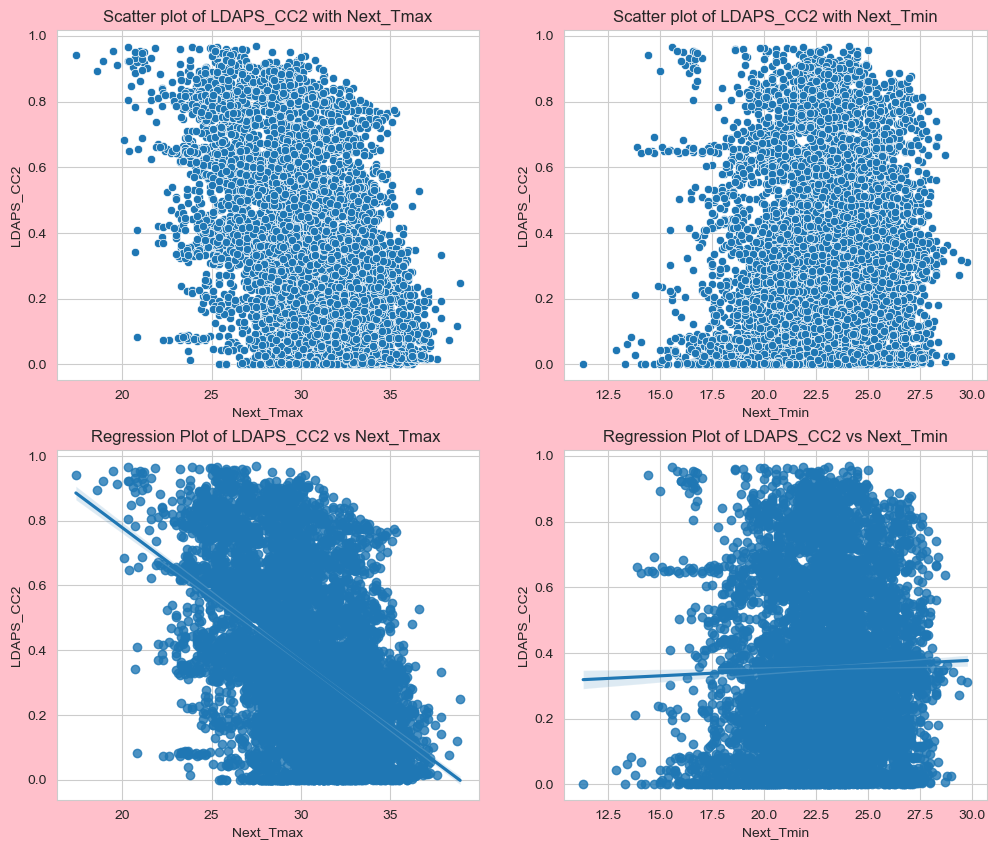

In [191]:
# looking catter plot and regression plot fot LDAPS_CC2 with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_CC2', palette='dark')
plt.title("Scatter plot of LDAPS_CC2 with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_CC2', palette='winter')
plt.title("Scatter plot of LDAPS_CC2 with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_CC2')
plt.title("Regression Plot of LDAPS_CC2 vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_CC2')
plt.title("Regression Plot of LDAPS_CC2 vs Next_Tmin")
plt.show()

There is strongly negative relation bewteen LDAPS_CC2 and Next_Tmax column where as no realtion with Next_Tmin.

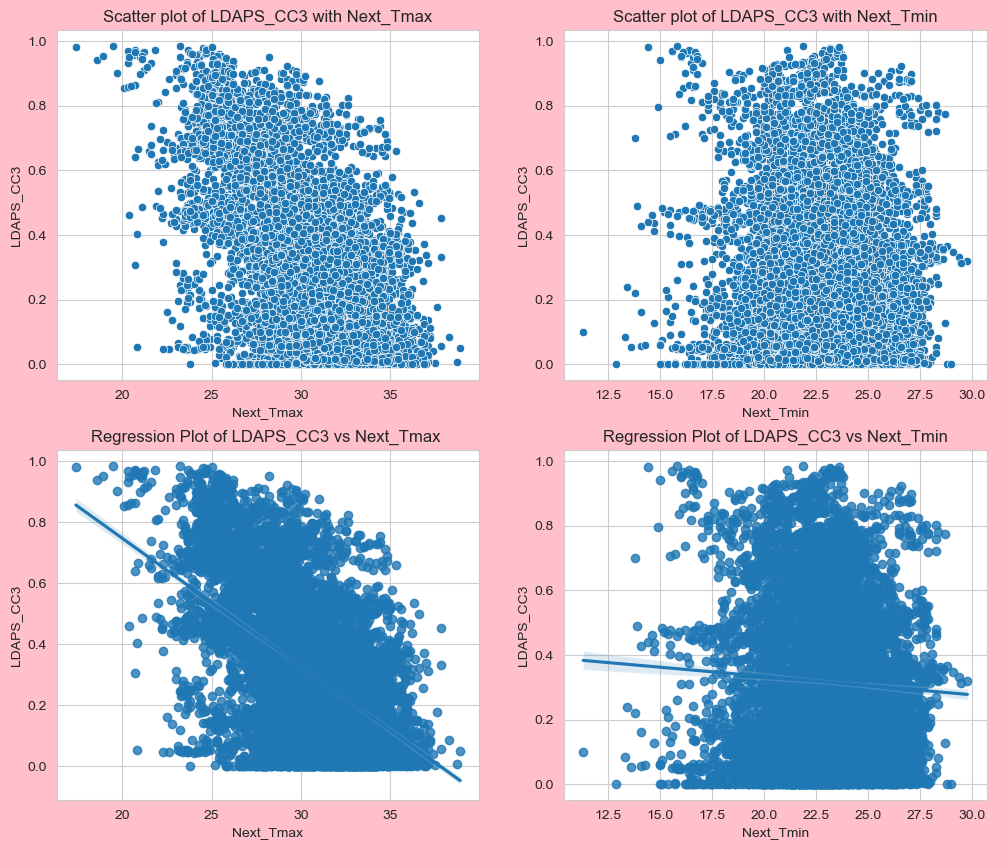

In [192]:
# looking catter plot and regression plot fot LDAPS_CC3 with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_CC3', palette='dark')
plt.title("Scatter plot of LDAPS_CC3 with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_CC3', palette='winter')
plt.title("Scatter plot of LDAPS_CC3 with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_CC3')
plt.title("Regression Plot of LDAPS_CC3 vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_CC3')
plt.title("Regression Plot of LDAPS_CC3 vs Next_Tmin")
plt.show()

There is strongly negative relation bewteen LDAPS_CC3 and Next_Tmax column where as no realtion with Next_Tmin.

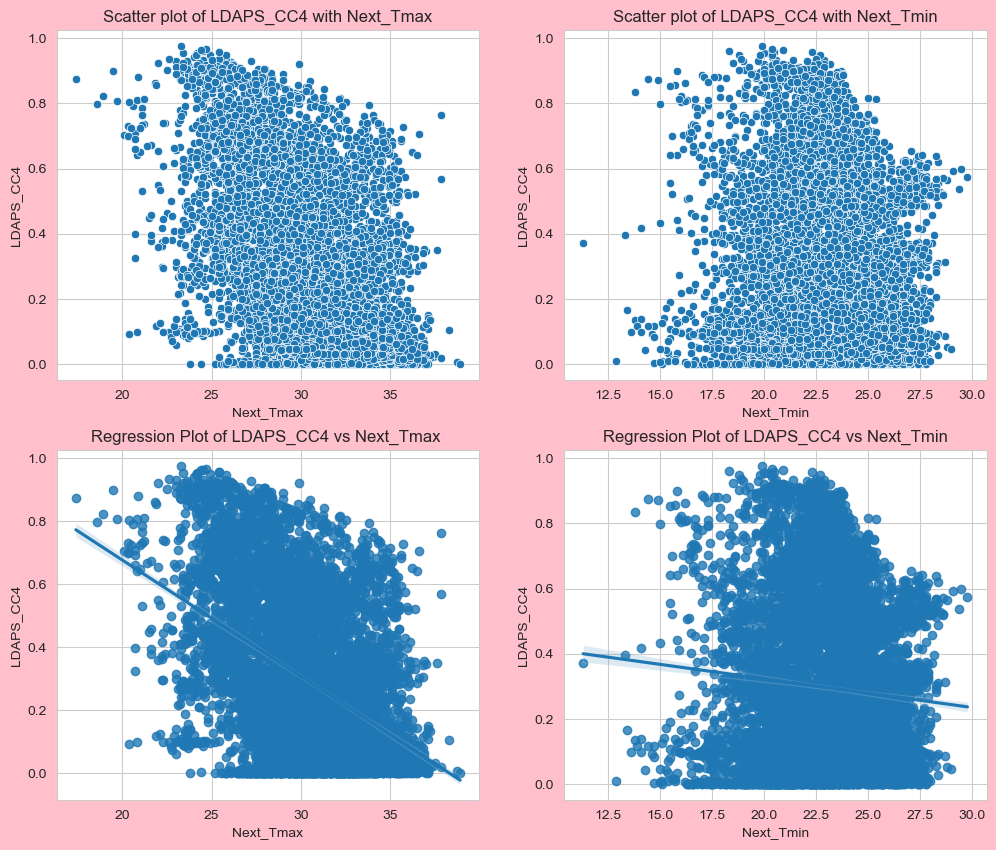

In [193]:
# looking catter plot and regression plot fot LDAPS_CC4 with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_CC4', palette='dark')
plt.title("Scatter plot of LDAPS_CC4 with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_CC4', palette='winter')
plt.title("Scatter plot of LDAPS_CC4 with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_CC4')
plt.title("Regression Plot of LDAPS_CC4 vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_CC4')
plt.title("Regression Plot of LDAPS_CC4 vs Next_Tmin")
plt.show()

There is strongly negative relation bewteen LDAPS_CC4 and Next_Tmax column where as no realtion with Next_Tmin.

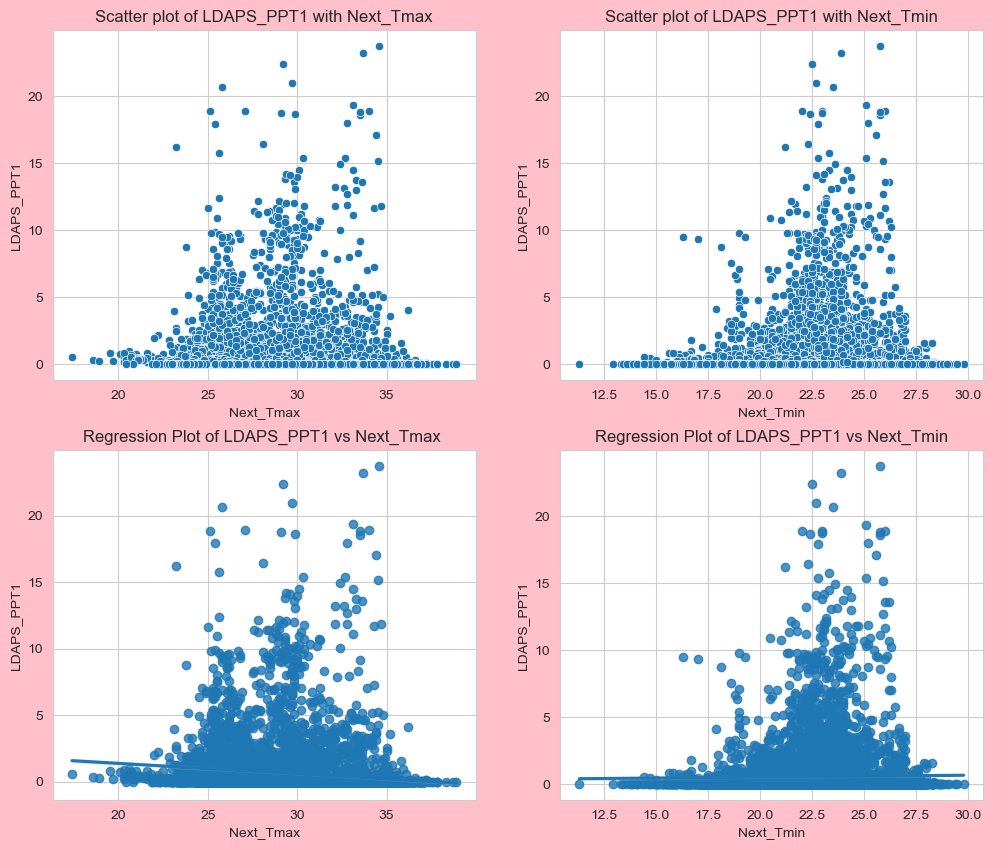

In [194]:
# looking catter plot and regression plot fot LDAPS_PPT1 with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_PPT1', palette='dark')
plt.title("Scatter plot of LDAPS_PPT1 with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_PPT1', palette='winter')
plt.title("Scatter plot of LDAPS_PPT1 with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_PPT1')
plt.title("Regression Plot of LDAPS_PPT1 vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_PPT1')
plt.title("Regression Plot of LDAPS_PPT1 vs Next_Tmin")
plt.show()

LDAPS_PPT1 is no related any of the target variable.

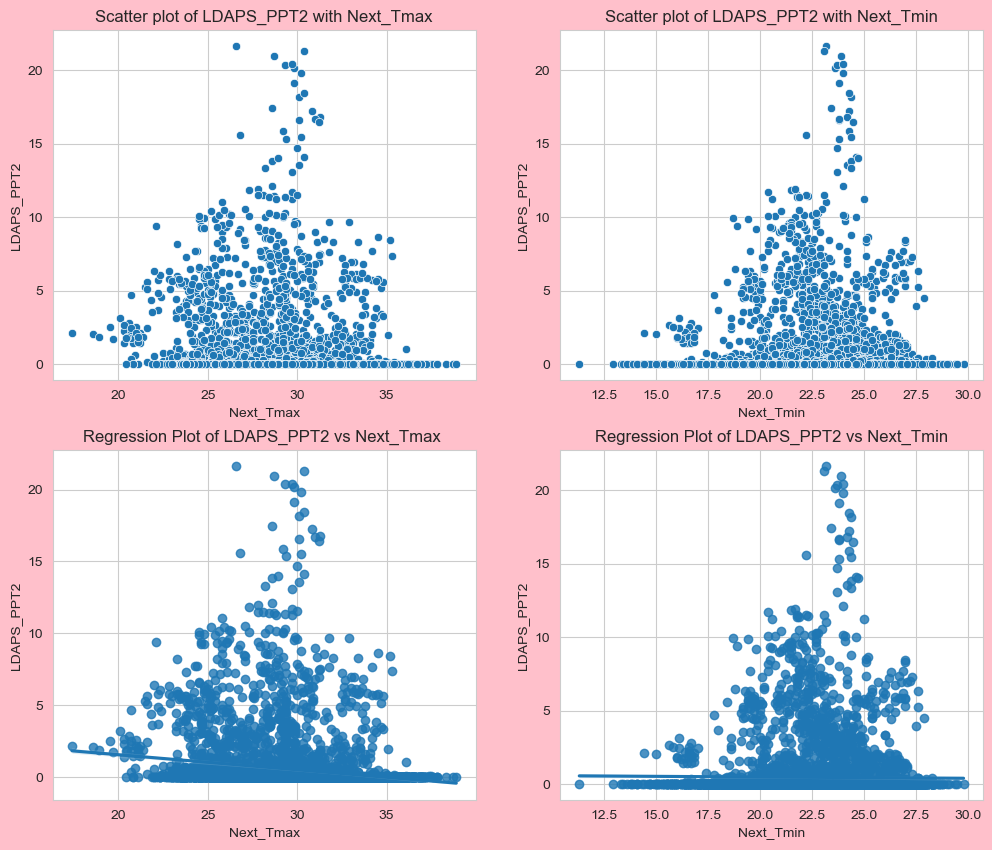

In [195]:
# looking catter plot and regression plot fot Present_Tmax with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_PPT2', palette='dark')
plt.title("Scatter plot of LDAPS_PPT2 with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_PPT2', palette='winter')
plt.title("Scatter plot of LDAPS_PPT2 with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_PPT2')
plt.title("Regression Plot of LDAPS_PPT2 vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_PPT2')
plt.title("Regression Plot of LDAPS_PPT2 vs Next_Tmin")
plt.show()

No relation between LDAPS_PPT2 with any of the label.

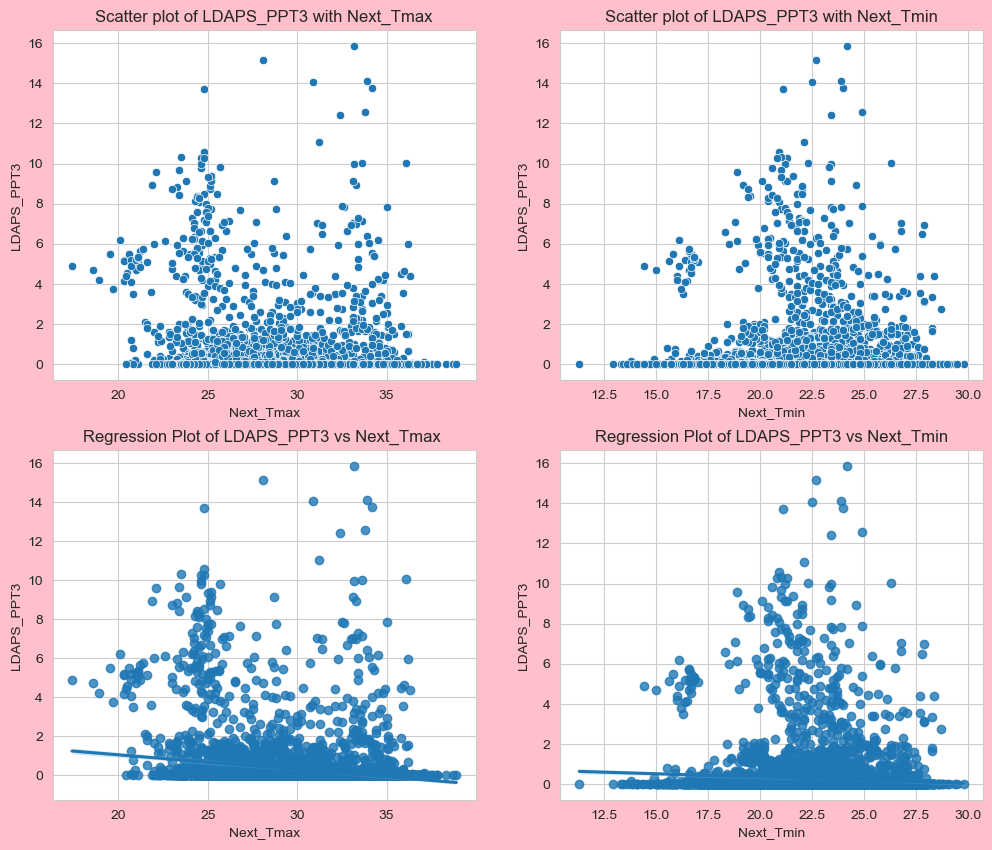

In [196]:
# looking catter plot and regression plot fot Present_Tmax with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_PPT3', palette='dark')
plt.title("Scatter plot of LDAPS_PPT3 with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_PPT3', palette='winter')
plt.title("Scatter plot of LDAPS_PPT3 with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_PPT3')
plt.title("Regression Plot of LDAPS_PPT3 vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_PPT3')
plt.title("Regression Plot of LDAPS_PPT3 vs Next_Tmin")
plt.show()

No relation between LDAPS_PPT3 with any of the label.

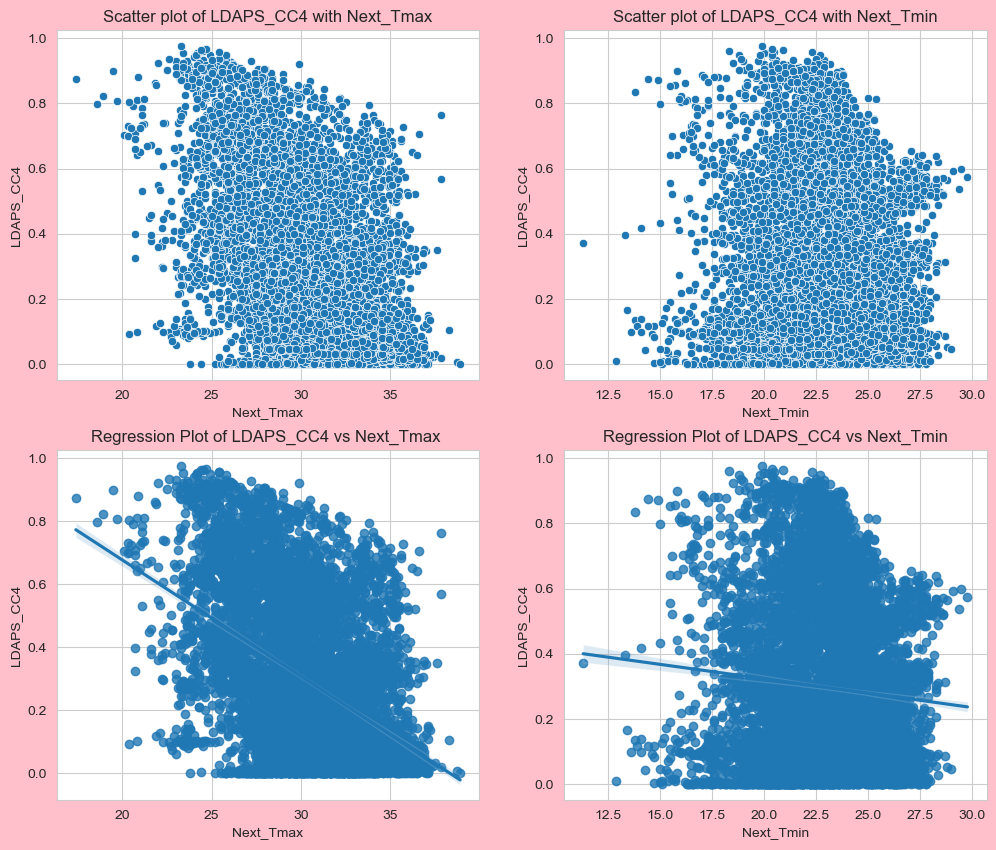

In [197]:
# looking catter plot and regression plot fot Present_Tmax with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='LDAPS_CC4', palette='dark')
plt.title("Scatter plot of LDAPS_CC4 with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='LDAPS_CC4', palette='winter')
plt.title("Scatter plot of LDAPS_CC4 with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='LDAPS_CC4')
plt.title("Regression Plot of LDAPS_CC4 vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='LDAPS_CC4')
plt.title("Regression Plot of LDAPS_CC4 vs Next_Tmin")
plt.show()

LDAPS_CC4 is negatively corelated with both the label.

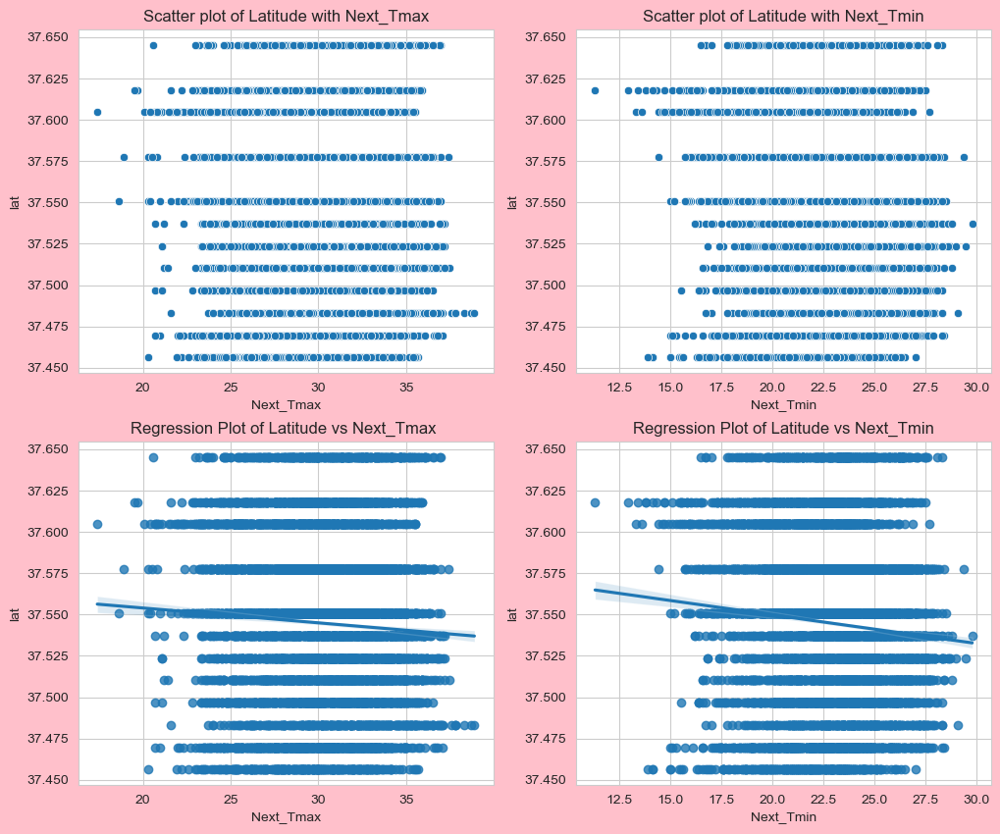

In [198]:
# looking catter plot and regression plot fot latitude with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='lat', palette='dark')
plt.title("Scatter plot of Latitude with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='lat', palette='winter')
plt.title("Scatter plot of Latitude with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='lat')
plt.title("Regression Plot of Latitude vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='lat')
plt.title("Regression Plot of Latitude vs Next_Tmin")
plt.show()

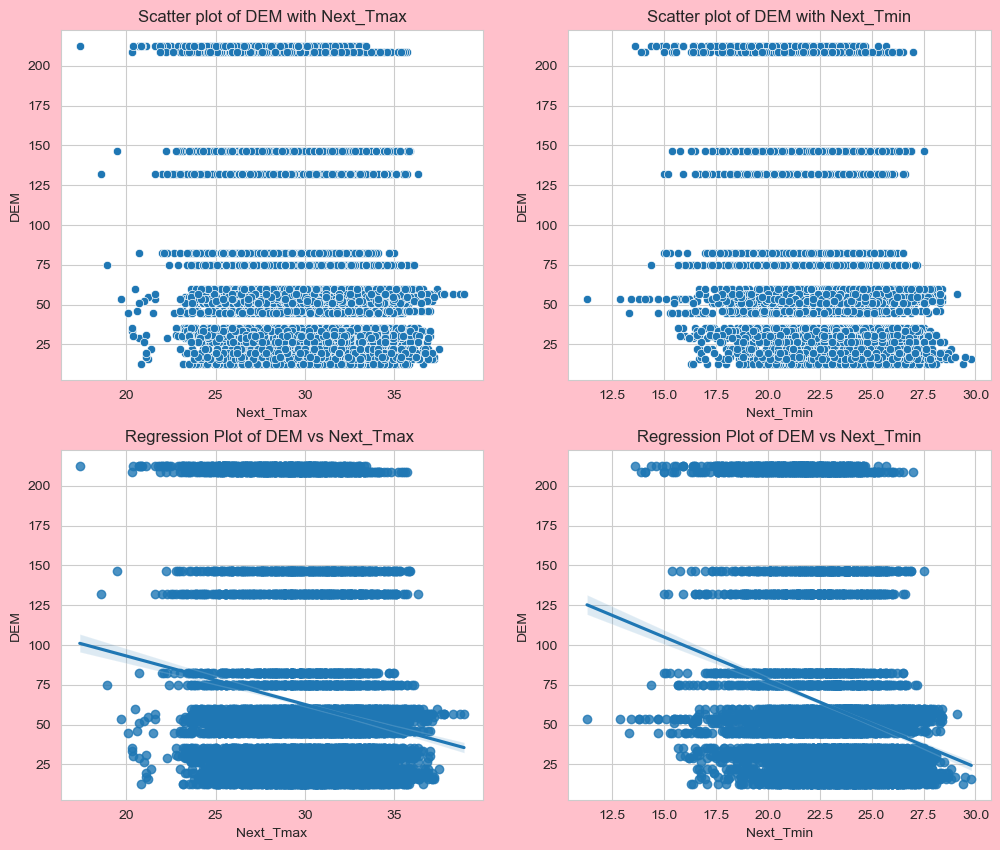

In [199]:
# looking catter plot and regression plot fot DEM with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='DEM', palette='dark')
plt.title("Scatter plot of DEM with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='DEM', palette='winter')
plt.title("Scatter plot of DEM with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='DEM')
plt.title("Regression Plot of DEM vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='DEM')
plt.title("Regression Plot of DEM vs Next_Tmin")
plt.show()

DEM is Negatively correlated with both the label.

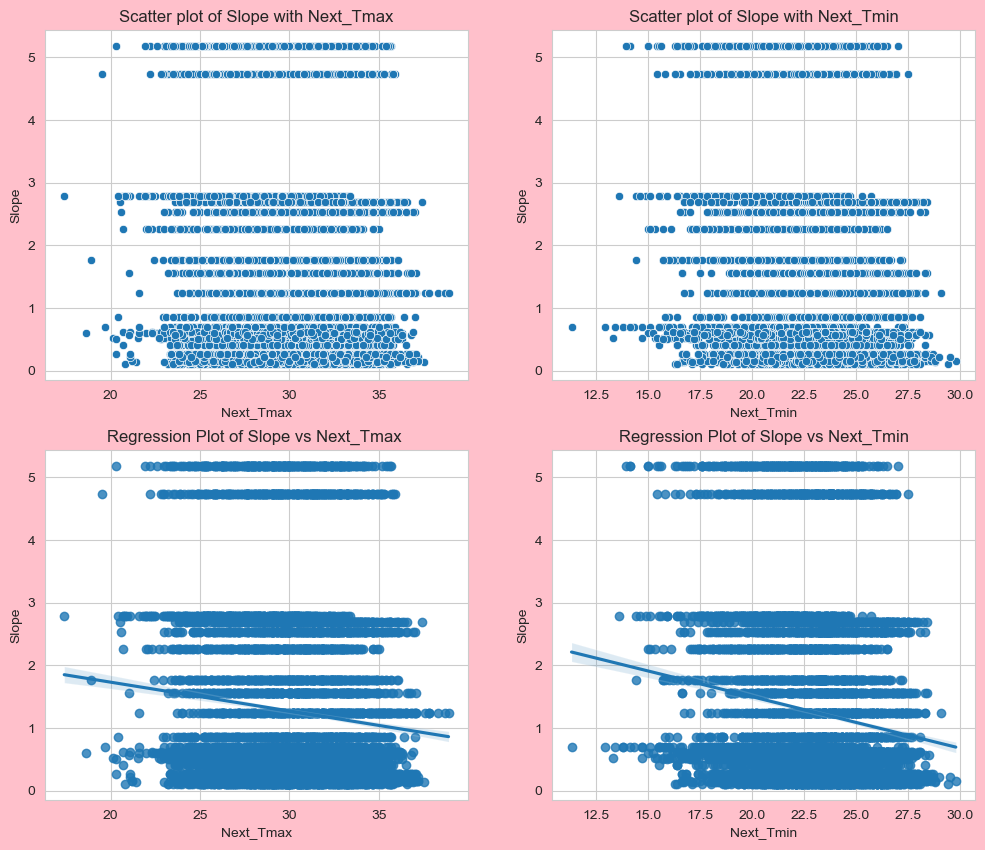

In [200]:
# looking catter plot and regression plot fot Slope with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='Slope', palette='dark')
plt.title("Scatter plot of Slope with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='Slope', palette='winter')
plt.title("Scatter plot of Slope with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='Slope')
plt.title("Regression Plot of Slope vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='Slope')
plt.title("Regression Plot of Slope vs Next_Tmin")
plt.show()

Slope is negatively corelated with both the label.

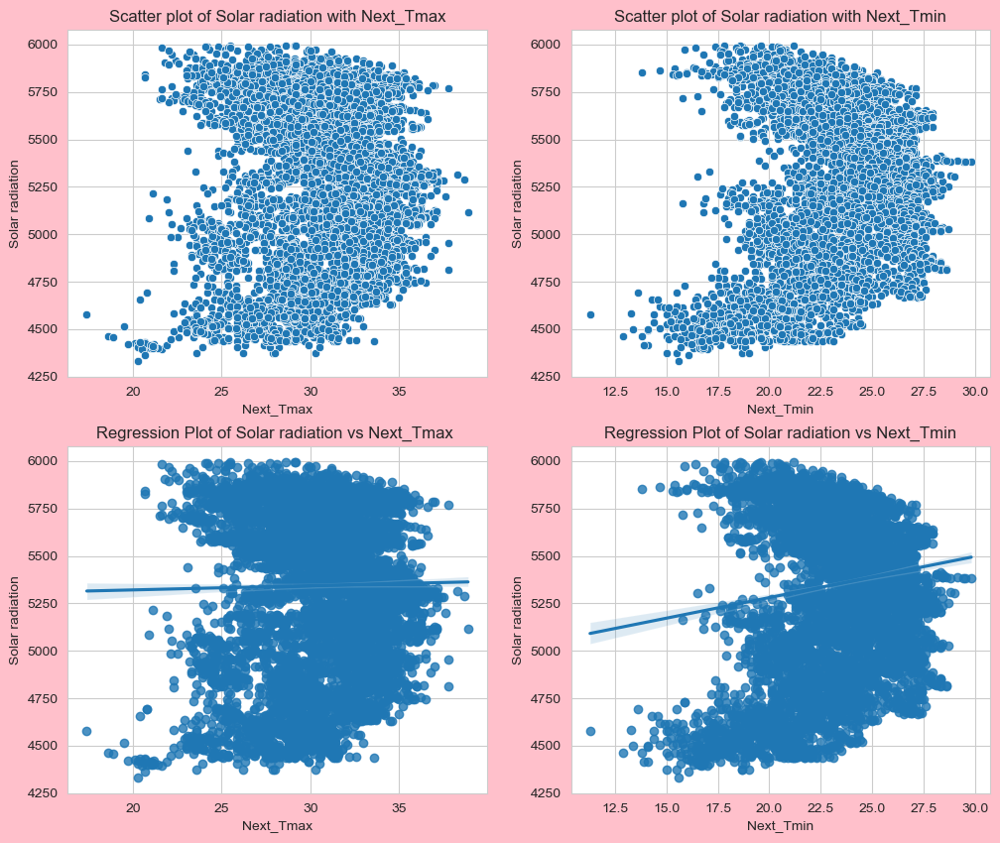

In [201]:
# looking catter plot and regression plot fot Solar radiation with target variable
plt.figure(figsize=(12,10), facecolor='pink')

plt.subplot(2,2,1)
sns.scatterplot(data=df, x='Next_Tmax', y='Solar radiation', palette='dark')
plt.title("Scatter plot of Solar radiation with Next_Tmax")

plt.subplot(2,2,2)
sns.scatterplot(data=df, x='Next_Tmin', y='Solar radiation', palette='winter')
plt.title("Scatter plot of Solar radiation with Next_Tmin")

plt.subplot(2,2,3)
sns.regplot(data=df, x='Next_Tmax', y='Solar radiation')
plt.title("Regression Plot of Solar radiation vs Next_Tmax ")

plt.subplot(2,2,4)
sns.regplot(data=df, x='Next_Tmin', y='Solar radiation')
plt.title("Regression Plot of Solar radiation vs Next_Tmin")
plt.show()

Solar radiation is not linearly corelated with Next_Tmax where as it is positively correlated with Next_Tmin column.

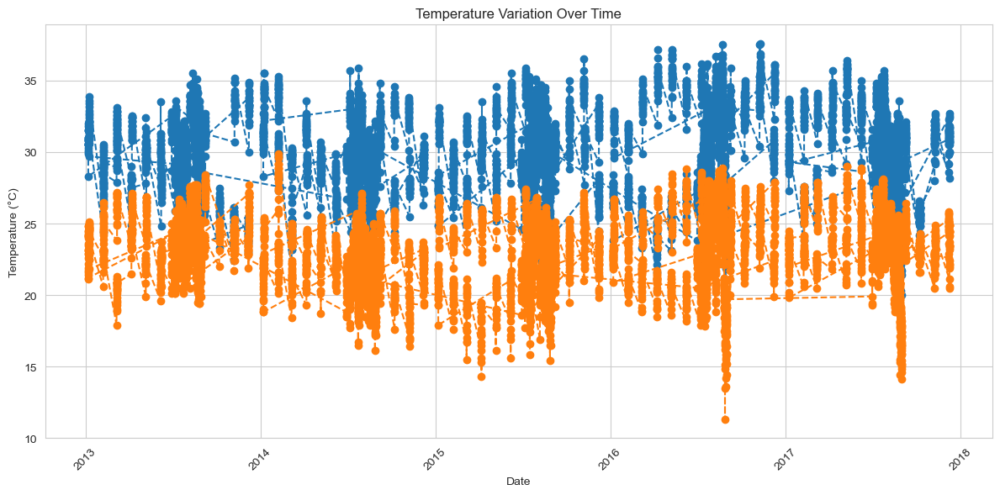

In [202]:
# Create a line plot of temperature variation with dates
plt.figure(figsize=(12, 6))
plt.plot(df['Date'], df[['Present_Tmax', 'Present_Tmin']], marker='o', linestyle='--')
plt.title('Temperature Variation Over Time')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

Hare we can see the present minimum temperatue and maximum temperature from which we can see the temperature range and its variation.
minimum temperature noted in the year of 2016 in august or september month. and that month we can found the maximum temperature range for every year in the dataset. and the minimum temperature variation found in the year of 2013.

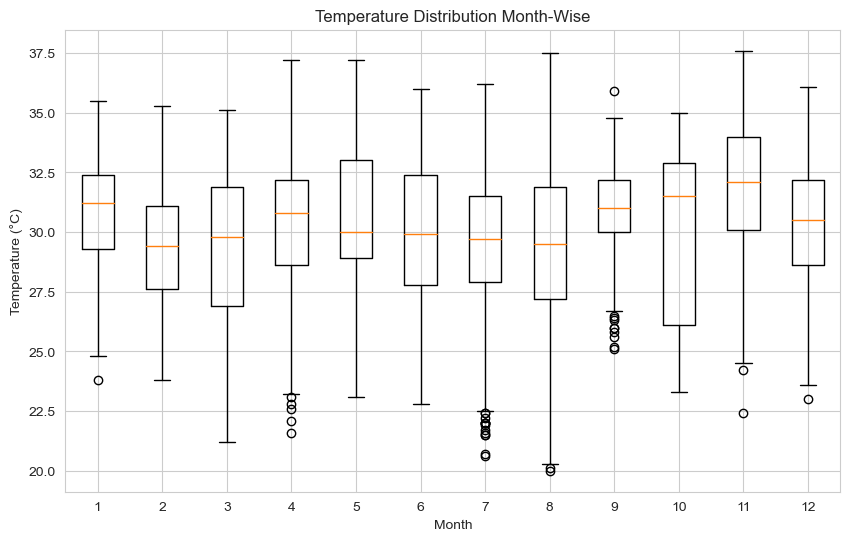

In [203]:
# Create a boxplot for temperature distribution month-wise
plt.figure(figsize=(10, 6))
plt.boxplot([df[df['Month'] == i]['Present_Tmax'] for i in range(1, 13)], labels=[str(i) for i in range(1, 13)])
plt.title('Temperature Distribution Month-Wise')
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')
plt.show()

The month wise box plot helps us to visualise clearly the mean temerature for any year. hare the maximum mean temparature 31°C noted in the month of November in Seoul, South Korea. 

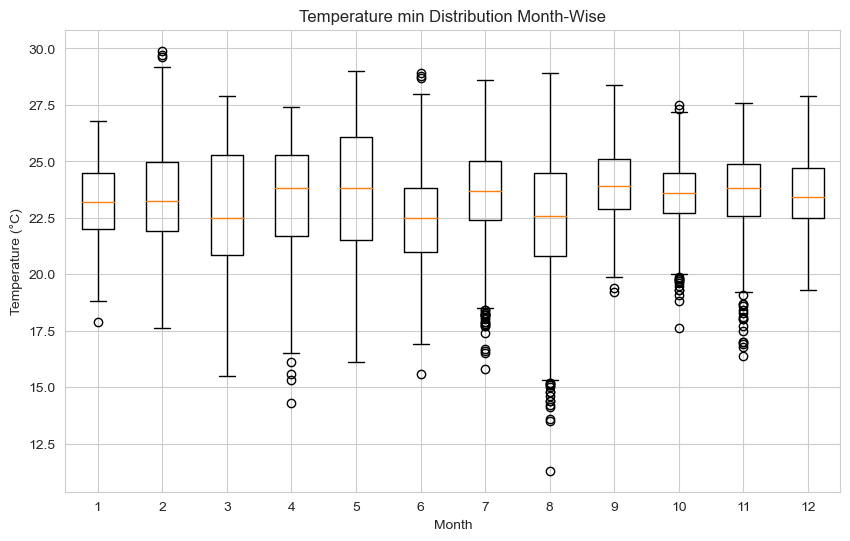

In [204]:
# Create a boxplot for temperature distribution month-wise
plt.figure(figsize=(10, 6))
plt.boxplot([df[df['Month'] == i]['Present_Tmin'] for i in range(1, 13)], labels=[str(i) for i in range(1, 13)])
plt.title('Temperature min Distribution Month-Wise')
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')
plt.show()

The minimum mean temperature is noted in the month of March and June about 22.5°C. 

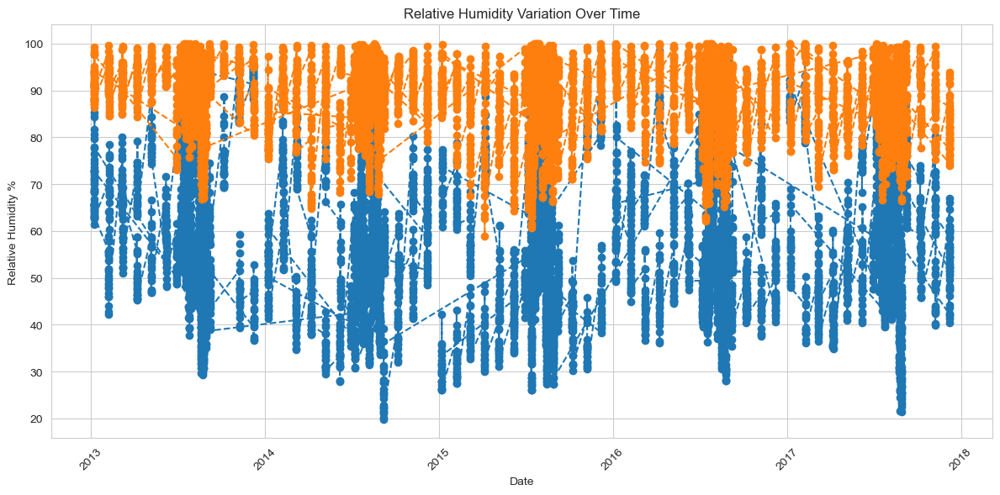

In [205]:
# Create a line plot of temperature variation with dates
plt.figure(figsize=(12, 6))
plt.plot(df['Date'], df[['LDAPS_RHmin','LDAPS_RHmax']], marker='o', linestyle='--')
plt.title('Relative Humidity Variation Over Time')
plt.xlabel('Date')
plt.ylabel('Relative Humidity %')
plt.grid(True)
plt.xticks(rotation=45) 
plt.tight_layout()
plt.show()

This plot shows us the variation of relative humidity date wise. from the line graph we can see that every year for a specific month there is large variation of relative humidity specificly from may to August month. The most large veriation found in the year 2014 probably in August month.

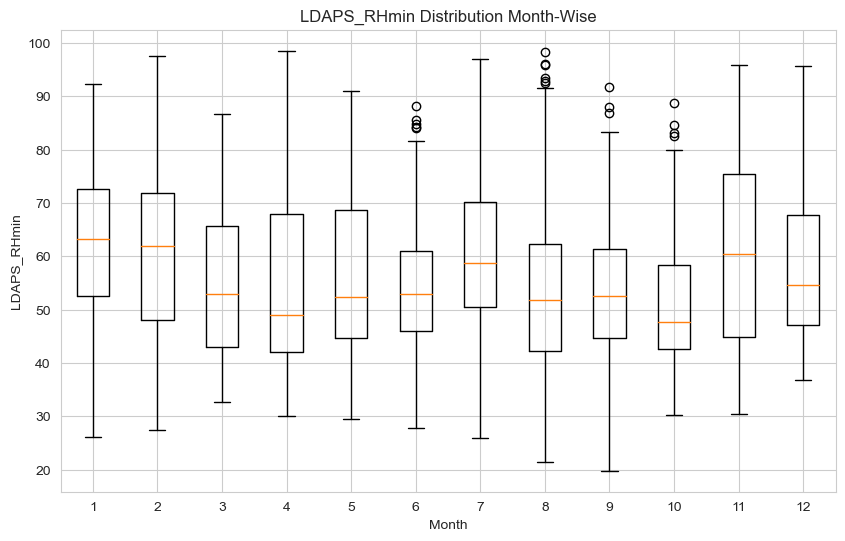

In [206]:
# Create a boxplot for LDAPS_RHmin distribution month-wise
plt.figure(figsize=(10, 6))
plt.boxplot([df[df['Month'] == i]['LDAPS_RHmin'] for i in range(1, 13)], labels=[str(i) for i in range(1, 13)])
plt.title('LDAPS_RHmin Distribution Month-Wise')
plt.xlabel('Month')
plt.ylabel('LDAPS_RHmin')
plt.show()

Minimum mean Relative humidity recorded in the month of April. mostly reative humidity varies from 20 to 95. 

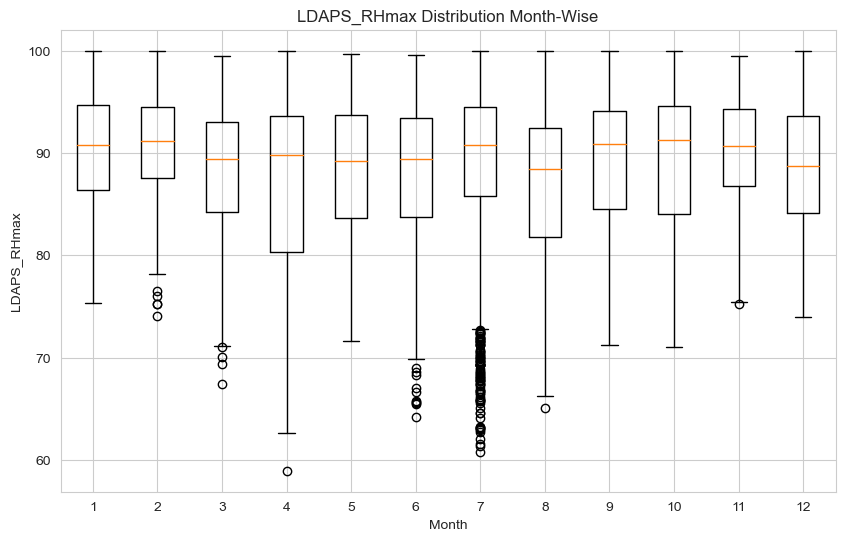

In [207]:
# Create a boxplot for LDAPS_RHmax distribution month-wise
plt.figure(figsize=(10, 6))
plt.boxplot([df[df['Month'] == i]['LDAPS_RHmax'] for i in range(1, 13)], labels=[str(i) for i in range(1, 13)])
plt.title('LDAPS_RHmax Distribution Month-Wise')
plt.xlabel('Month')
plt.ylabel('LDAPS_RHmax')
plt.show()

Maximum Mean relative hymidity recorded for each month about 90%.

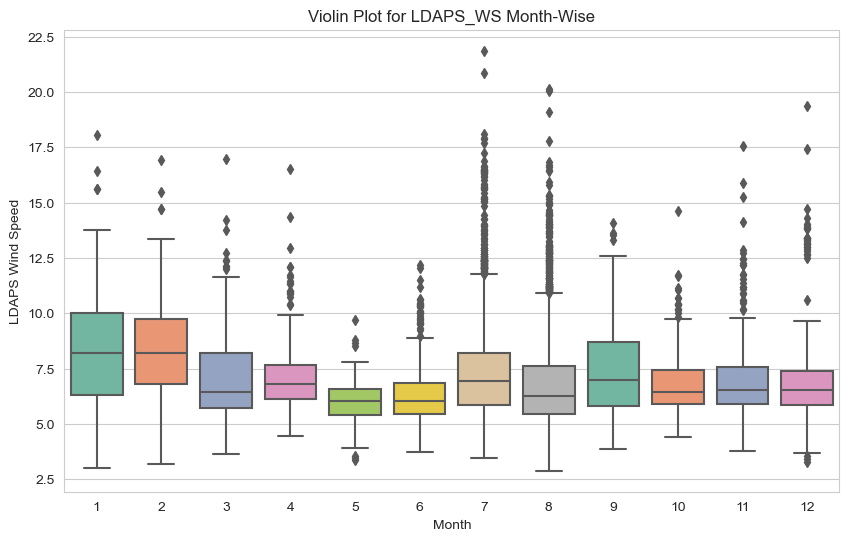

In [208]:
# Set the style for the plot
sns.set_style("whitegrid")

# Create a Violin Plot for LDAPS_WS month-wise
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Month', y='LDAPS_WS', palette='Set2')
plt.title('Violin Plot for LDAPS_WS Month-Wise')
plt.xlabel('Month')
plt.ylabel('LDAPS Wind Speed')
plt.show()

In every year most of the time mean wind speed is about 6 m/s. Maximum range of wind speed found in the month January. in the month of July maximum wind speed recorded and it is about 21m/s.

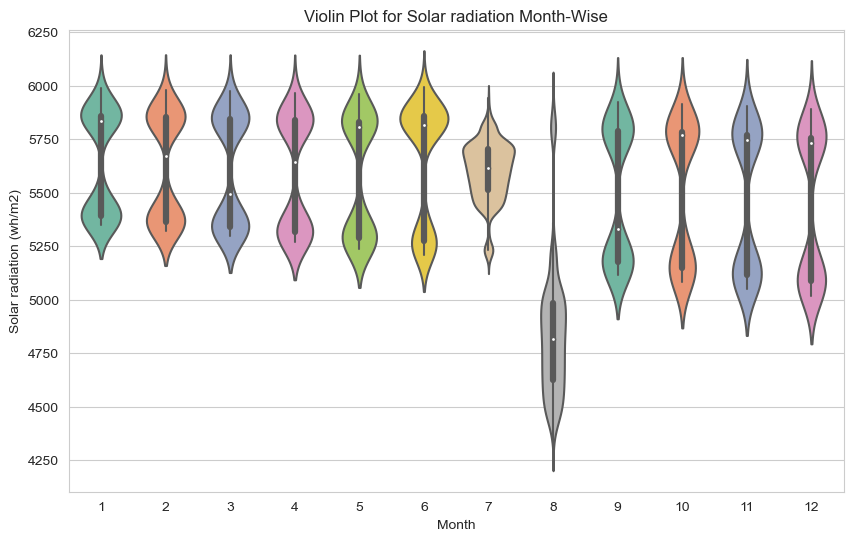

In [209]:
# Set the style for the plot
sns.set_style("whitegrid")

# Create a Violin Plot for Solar radiation month-wise
plt.figure(figsize=(10, 6))
sns.violinplot(data=df, x='Month', y='Solar radiation', inner='box', palette='Set2')
plt.title('Violin Plot for Solar radiation Month-Wise')
plt.xlabel('Month')
plt.ylabel('Solar radiation (wh/m2)')
plt.show()

Lowest mean Solor radiation recorded in the month of August.

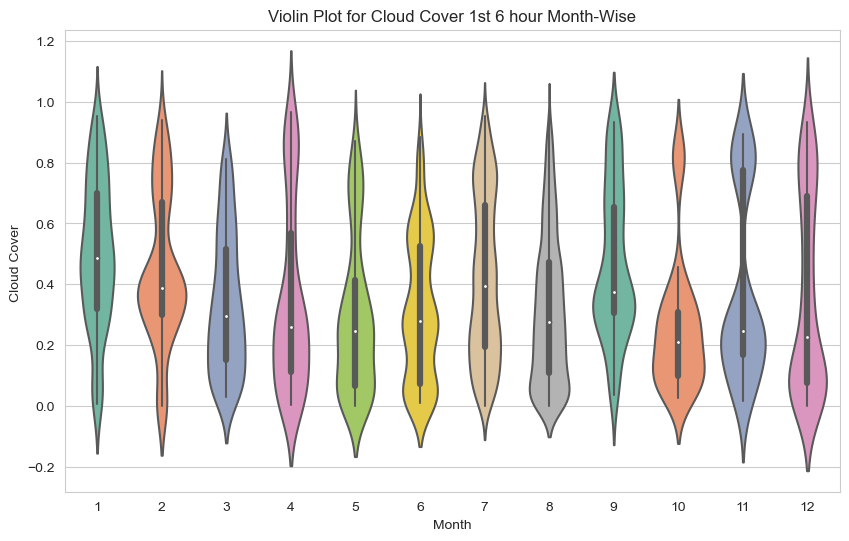

In [210]:
# Set the style for the plot
sns.set_style("whitegrid")

# Create a Violin Plot for Solar radiation month-wise
plt.figure(figsize=(10, 6))
sns.violinplot(data=df, x='Month', y='LDAPS_CC1', inner='box', palette='Set2')
plt.title('Violin Plot for Cloud Cover 1st 6 hour Month-Wise')
plt.xlabel('Month')
plt.ylabel('Cloud Cover ')
plt.show()

We can see the median point for every month and which shows that in the month January maximun clouds covers where as in April, may month cloud cover is very less. 

In [211]:
# Dropping irrelavant column
df.drop(['Date','Day', 'Month'], axis=1, inplace=True)

## Data Preprocessing

#### Skewness Handeling

In [213]:
# Checking Skewness
df.skew()

station            -0.004178
Present_Tmax       -0.257069
Present_Tmin       -0.353822
LDAPS_RHmin         0.301396
LDAPS_RHmax        -0.845264
LDAPS_Tmax_lapse   -0.222349
LDAPS_Tmin_lapse   -0.574035
LDAPS_WS            1.553926
LDAPS_LH            0.662971
LDAPS_CC1           0.456716
LDAPS_CC2           0.473929
LDAPS_CC3           0.639649
LDAPS_CC4           0.663815
LDAPS_PPT1          5.305906
LDAPS_PPT2          5.710360
LDAPS_PPT3          6.356670
LDAPS_PPT4          6.681256
lat                 0.085377
lon                -0.289048
DEM                 1.721617
Slope               1.559050
Solar radiation    -0.524325
Next_Tmax          -0.334842
Next_Tmin          -0.393662
dtype: float64

Allowlable range for skewness is -0.5 to +0.5. Hare we can observe that there is skewness present in 'LDAPS_RHmax', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'DEM', 'Slope', 'Solar radiation' columns     

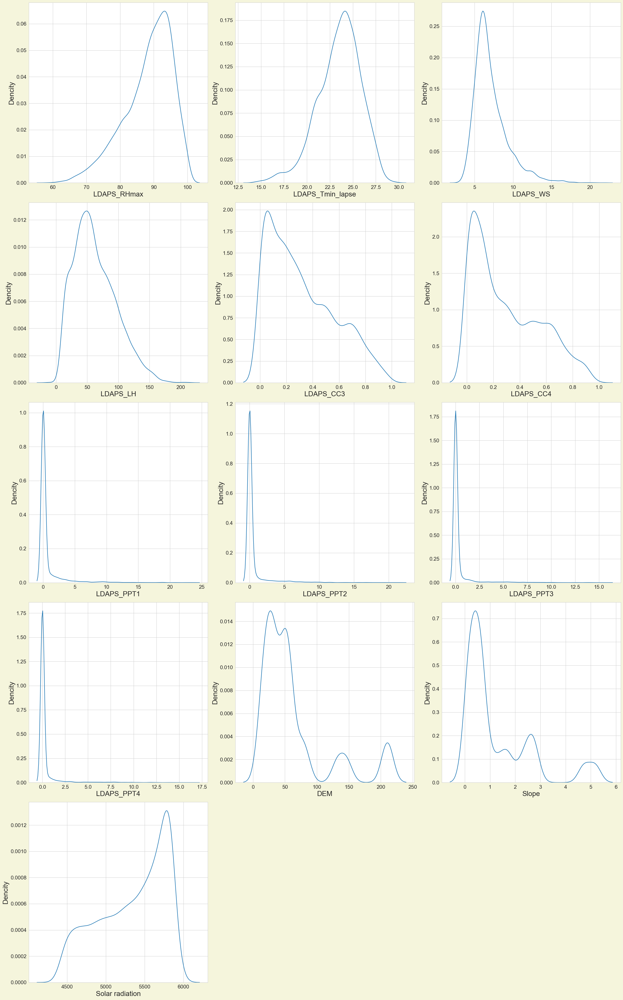

In [214]:
# lets visualise the distribution of data 
plt.figure(figsize=(25,40), facecolor='beige')

features = ['LDAPS_RHmax', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
            'LDAPS_LH', 'LDAPS_CC3', 'LDAPS_CC4',
            'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 
            'LDAPS_PPT4', 'DEM', 'Slope', 'Solar radiation']
pltno=1
for col in features:
    if pltno<25:
        plt.subplot(5,3,pltno)
        sns.kdeplot(df[col])
        plt.xlabel(col, fontsize=20)
        plt.ylabel("Dencity", fontsize=20)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
    pltno+=1
plt.tight_layout()

In [215]:
# Removing skewness using yeo johnson to get better predictions
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
df[features] = scaler.fit_transform(df[features].values)
# again checking the skewness
df.skew()

station            -0.004178
Present_Tmax       -0.257069
Present_Tmin       -0.353822
LDAPS_RHmin         0.301396
LDAPS_RHmax        -0.120174
LDAPS_Tmax_lapse   -0.222349
LDAPS_Tmin_lapse   -0.021647
LDAPS_WS            0.005937
LDAPS_LH            0.028141
LDAPS_CC1           0.456716
LDAPS_CC2           0.473929
LDAPS_CC3           0.091156
LDAPS_CC4           0.129974
LDAPS_PPT1          1.451770
LDAPS_PPT2          1.637689
LDAPS_PPT3          1.814526
LDAPS_PPT4          2.041426
lat                 0.085377
lon                -0.289048
DEM                 0.039591
Slope               0.233968
Solar radiation    -0.182349
Next_Tmax          -0.334842
Next_Tmin          -0.393662
dtype: float64

In [216]:
df.head().T

,0,1,2,3,4
station,1.000000,2.000000,3.000000,4.000000,5.000000
Present_Tmax,28.700000,31.900000,31.600000,32.000000,31.400000
Present_Tmin,21.400000,21.600000,23.300000,23.400000,21.900000
LDAPS_RHmin,58.255688,52.263397,48.690479,58.239788,56.174095
LDAPS_RHmax,0.271501,0.184890,-0.769141,1.309753,0.110434
LDAPS_Tmax_lapse,28.074101,29.850689,30.091292,29.704629,29.113934
LDAPS_Tmin_lapse,-0.311364,0.143619,0.392812,-0.173951,-0.103645
LDAPS_WS,0.097802,-0.619344,-0.309297,-0.650457,-0.587672
LDAPS_LH,0.318528,-0.201095,-1.380242,0.213209,1.292312
LDAPS_CC1,0.233947,0.225508,0.209344,0.216372,0.151407


Still there is skewness present in the dara det for the column LDAPS_PPT columns.

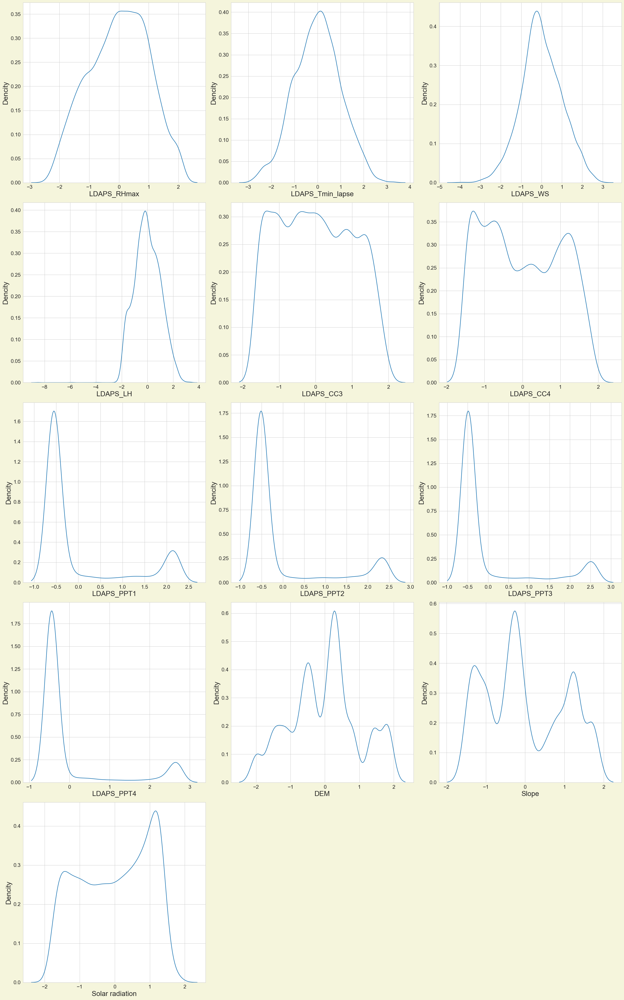

In [217]:
# lets visualise the distribution of data 
plt.figure(figsize=(25,40), facecolor='beige')
pltno=1
for col in features:
    if pltno<25:
        plt.subplot(5,3,pltno)
        sns.kdeplot(df[col])
        plt.xlabel(col, fontsize=20)
        plt.ylabel("Dencity", fontsize=20)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
    pltno+=1
plt.tight_layout()

Now we can see that most of the data is distributed normally. Hence now we can perform Outliers operation. for outliers er can do apply zscore method as well as IQR method.

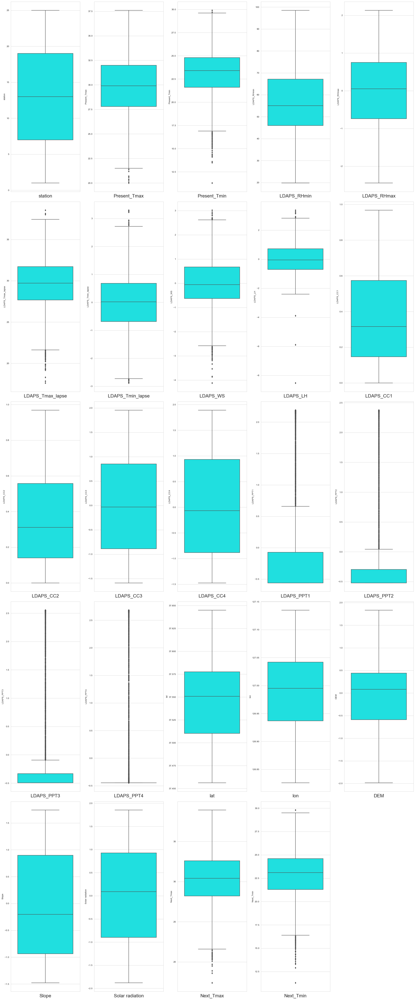

In [218]:
# Identifying the outliers present in numerical columns using boxplot
columns=['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
        'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
        'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
        'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
        'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin']
plt.figure(figsize=(25,60))
plotnumber=1
for col in columns:
    if plotnumber<=25:
        ax=plt.subplot(5,5,plotnumber)
        sns.boxplot(data=df, y=col,color='cyan')
        plt.xlabel(col,fontsize=20)
    plotnumber+=1
plt.tight_layout()


There is huge outliers present in 'Present_Tmax', 'Present_Tmin', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS','LDAPS_LH', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'Next_Tmax', 'Next_Tmin' columns.

#### Z Score Method

In [219]:
# Features having outliers
data=df[columns]

# Using zscore to remove outliers
from scipy.stats import zscore
z=np.abs(zscore(data))
z

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.664607,0.353318,0.748029,0.104660,0.271501,0.525269,0.311364,0.097802,0.318528,0.513123,...,0.521172,0.4944,0.447011,1.186076,0.005302,1.833902,1.311979,1.852498,0.366861,0.689265
1,1.526052,0.725138,0.664721,0.305052,0.184890,0.078334,0.143619,0.619344,0.201095,0.545304,...,0.521172,0.4944,0.447011,1.186076,0.512280,0.055065,0.387168,1.398583,0.083068,0.165513
2,1.387498,0.624033,0.043400,0.549344,0.769141,0.160080,0.392812,0.309297,1.380242,0.606944,...,0.521172,0.4944,0.447011,0.650626,0.840503,0.365481,0.950272,1.378325,0.275895,0.398527
3,1.248943,0.758840,0.085054,0.103573,1.309753,0.028710,0.173951,0.650457,0.213209,0.580143,...,0.521172,0.4944,0.447011,1.987268,0.386040,0.083964,1.233016,1.355226,0.468721,0.559681
4,1.110389,0.556630,0.539758,0.037665,0.110434,0.171981,0.103645,0.587672,1.292312,0.827872,...,0.521172,0.4944,0.447011,0.117159,1.812547,0.291349,0.403544,1.364282,0.308032,0.165513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,1.106481,2.240616,2.247578,2.190405,1.375942,0.614083,1.960554,0.023579,1.969347,1.203497,...,0.521172,0.4944,0.447011,0.117159,0.613271,0.722455,0.281473,1.734456,0.848928,2.099366
7746,1.245036,2.442826,2.414195,1.820788,0.803558,0.990460,2.094605,0.563635,0.660500,1.151793,...,0.521172,0.4944,0.447011,0.686016,1.193973,1.006916,1.355268,1.751541,0.720377,2.341098
7747,1.383590,2.173212,2.539157,2.050081,1.319444,1.110333,1.824694,0.302325,0.390795,1.290699,...,0.521172,0.4944,0.447011,0.150566,1.267697,1.579065,1.281031,1.749736,0.623964,1.938212
7748,1.522145,2.173212,2.289232,2.234735,1.462026,0.886737,1.837066,0.058794,0.352678,1.268430,...,0.521172,0.4944,0.447011,0.418291,1.040466,1.401562,1.073867,1.755630,0.527550,1.656192


In [220]:
# index position of data having zscore more than 3
np.where(z>3)

(array([1751, 2091, 2154, 2316, 2413, 2425, 2591, 2599, 2633, 2699, 2700,
        2708, 2733, 3123, 3141, 3147, 3148, 3148, 3166, 3172, 3173, 3223,
        3435, 3437, 3481, 3522, 4281, 4506, 4531, 4656, 4708, 4964, 4989,
        4989, 5014, 5379, 5675, 5949, 5959, 5967, 5972, 5973, 5982, 5983,
        5991, 5997, 5998, 6007, 6007, 6008, 6016, 6023, 6032, 6032, 6033,
        6035, 6041, 6048, 6048, 6050, 6051, 6057, 6057, 6057, 6057, 6058,
        6058, 6058, 6059, 6059, 6060, 6060, 6061, 6061, 6062, 6063, 6063,
        6065, 6065, 6066, 6066, 6066, 6067, 6068, 6068, 6068, 6069, 6069,
        6071, 6071, 6072, 6072, 6073, 6073, 6073, 6074, 6075, 6075, 6076,
        6076, 6077, 6117, 6140, 6957, 6970, 6971, 6979, 6980, 6981, 7450,
        7457, 7474, 7481, 7506, 7515, 7515, 7539, 7539, 7539, 7539, 7539,
        7540, 7547, 7549, 7553, 7554, 7556, 7557, 7557, 7563, 7563, 7563,
        7564, 7564, 7571, 7572, 7572, 7574, 7578, 7579, 7579, 7581, 7582],
       dtype=int64),
 array([ 8,  7, 

In [221]:
# Creating new dataframe
new_df = df[(z<3).all(axis=1)]
new_df

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,28.7,21.4,58.255688,0.271501,28.074101,-0.311364,0.097802,0.318528,0.233947,...,-0.521172,-0.4944,-0.447011,37.6046,126.991,1.833902,1.311979,1.852498,29.1,21.2
1,2.0,31.9,21.6,52.263397,0.184890,29.850689,0.143619,-0.619344,-0.201095,0.225508,...,-0.521172,-0.4944,-0.447011,37.6046,127.032,0.055065,-0.387168,1.398583,30.5,22.5
2,3.0,31.6,23.3,48.690479,-0.769141,30.091292,0.392812,-0.309297,-1.380242,0.209344,...,-0.521172,-0.4944,-0.447011,37.5776,127.058,-0.365481,-0.950272,1.378325,31.1,23.9
3,4.0,32.0,23.4,58.239788,1.309753,29.704629,-0.173951,-0.650457,0.213209,0.216372,...,-0.521172,-0.4944,-0.447011,37.6450,127.022,0.083964,1.233016,1.355226,31.7,24.3
4,5.0,31.4,21.9,56.174095,0.110434,29.113934,-0.103645,-0.587672,1.292312,0.151407,...,-0.521172,-0.4944,-0.447011,37.5507,127.135,-0.291349,-0.403544,1.364282,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,-1.375942,27.812697,-1.960554,-0.023579,-1.969347,0.052902,...,-0.521172,-0.4944,-0.447011,37.5507,127.040,-0.722455,-0.281473,-1.734456,27.6,17.7
7746,22.0,22.5,17.4,30.094858,-0.803558,26.704905,-2.094605,-0.563635,0.660500,0.066461,...,-0.521172,-0.4944,-0.447011,37.5102,127.086,-1.006916,-1.355268,-1.751541,28.0,17.1
7747,23.0,23.3,17.1,26.741310,-1.319444,26.352081,-1.824694,-0.302325,0.390795,0.030034,...,-0.521172,-0.4944,-0.447011,37.5372,126.891,-1.579065,-1.281031,-1.749736,28.3,18.1
7748,24.0,23.3,17.7,24.040634,-1.462026,27.010193,-1.837066,-0.058794,-0.352678,0.035874,...,-0.521172,-0.4944,-0.447011,37.5237,126.909,-1.401562,-1.073867,-1.755630,28.6,18.8


In [222]:
print("Shape of dataset before removing outliers :",df.shape)
print("Shape of dataset after removing outliers :", new_df.shape)

Shape of dataset before removing outliers : (7588, 24)
Shape of dataset after removing outliers : (7482, 24)


In [223]:
print("Data Loss Percentage in zscore method = ",((7588-7482)/7588)*100)

Data Loss Percentage in zscore method =  1.39694254085398


#### IQR Method

In [224]:
# 1st quantile
Q1 = data.quantile(0.25)

# 3rd quantile
Q3 = data.quantile(0.75)

# IQR
IQR = Q3-Q1
df1 = df[~((df<(Q1-1.5*IQR))|(df>(Q3+1.5*IQR))).any(axis=1)]

In [225]:
print("Shape of dataset before removing outliers in IQR Method :",df.shape)
print("Shape of dataset after removing outliers in IQR Method :", df1.shape)

Shape of dataset before removing outliers in IQR Method : (7588, 24)
Shape of dataset after removing outliers in IQR Method : (3938, 24)


In [226]:
# data loss percentage in IQR method
print("Data Loss percentage in IQR Method =",round(((7588-3938)/7588)*100,2))

Data Loss percentage in IQR Method = 48.1


Hence the dataloss percentage is much high in IQR method than zscore method. we will zscore method for model preparation. 

In [227]:
# Checking the correlation between features and label
cor = new_df.corr()
cor

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.105794,0.130321,-0.067506,-0.178037,0.062770,0.104714,0.023713,-0.130974,0.007288,...,-0.006542,-0.010764,-0.002283,-0.241594,-0.122338,-0.320476,-0.141193,-0.027895,0.100908,0.125809
Present_Tmax,0.105794,1.000000,0.602123,-0.212245,-0.340621,0.559418,0.621792,-0.090075,0.133351,-0.319984,...,-0.152968,-0.100861,-0.096203,-0.047666,0.011233,-0.135703,-0.096188,-0.093601,0.597468,0.608379
Present_Tmin,0.130321,0.602123,1.000000,0.128491,-0.039162,0.439987,0.756516,0.012034,-0.001956,0.092873,...,0.080126,0.006052,-0.081912,-0.072694,-0.037318,-0.237315,-0.157872,-0.046963,0.437032,0.784164
LDAPS_RHmin,-0.067506,-0.212245,0.128491,1.000000,0.596279,-0.577503,0.073877,0.227896,-0.033751,0.610808,...,0.577012,0.442290,0.294075,0.080238,-0.080542,0.066883,0.088999,0.235410,-0.449815,0.098050
LDAPS_RHmax,-0.178037,-0.340621,-0.039162,0.596279,1.000000,-0.411685,-0.179635,0.114412,0.255424,0.459957,...,0.400167,0.259987,0.174571,0.228384,0.015340,0.185809,0.219041,0.162062,-0.326529,-0.104042
LDAPS_Tmax_lapse,0.062770,0.559418,0.439987,-0.577503,-0.411685,1.000000,0.635863,-0.219795,0.024862,-0.444482,...,-0.406177,-0.326049,-0.262706,-0.032649,0.101635,-0.115295,-0.111564,-0.037867,0.826944,0.569820
LDAPS_Tmin_lapse,0.104714,0.621792,0.756516,0.073877,-0.179635,0.635863,1.000000,-0.044183,-0.137431,-0.001881,...,-0.015896,-0.069471,-0.132815,-0.091784,-0.018049,-0.177527,-0.165894,0.012486,0.573247,0.876238
LDAPS_WS,0.023713,-0.090075,0.012034,0.227896,0.114412,-0.219795,-0.044183,1.000000,-0.032145,0.238559,...,0.226996,0.142502,0.218931,0.003813,-0.068106,0.134965,0.119310,0.185527,-0.264948,-0.024730
LDAPS_LH,-0.130974,0.133351,-0.001956,-0.033751,0.255424,0.024862,-0.137431,-0.032145,1.000000,-0.119599,...,-0.084735,0.005498,0.043402,0.111445,0.013821,0.040301,0.059202,-0.041041,0.150413,-0.051693
LDAPS_CC1,0.007288,-0.319984,0.092873,0.610808,0.459957,-0.444482,-0.001881,0.238559,-0.119599,1.000000,...,0.603807,0.333908,0.245329,-0.013341,-0.008033,-0.020229,-0.024793,0.221284,-0.462361,-0.009269


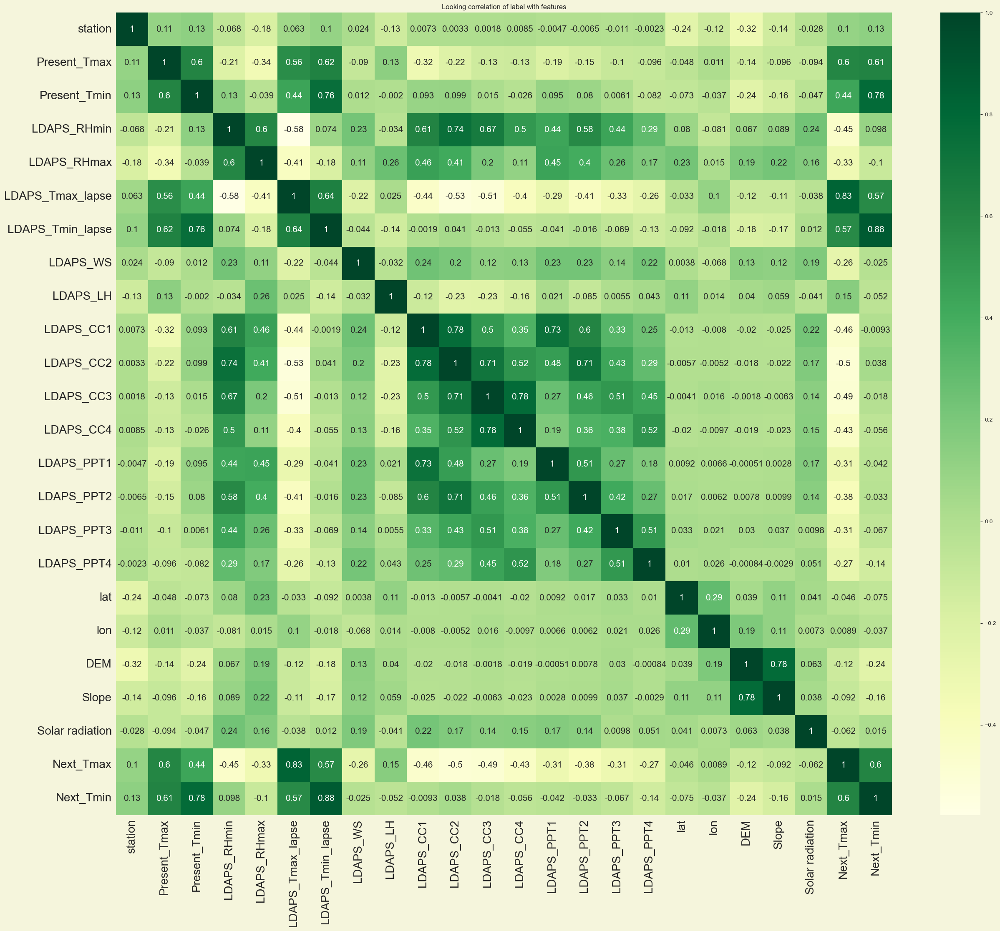

In [231]:
# visualizing corr value
plt.figure(figsize=(30,25), facecolor='beige')
plt.title("Looking correlation of label with features")
sns.heatmap(cor,annot=True,linecolor='black',cmap="YlGn",fmt='.2g',annot_kws={'size':15})
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

This heatmap shows the correlation matrix. We can visualize the relation between the feature to feature and feature to label.This heatmap contains both positive and negative correlation.

**Correlation Between Next_Tmax and Features**
* The label Next_Tmax is highly positively correlated with LDAPS_Tmax_lapse, and moderately correlated with Present_Tmax, Present_Tmin, LDAPS_Tmin_lapse column.
* The label is moderately negative correlated with LDAPS_RHmin, LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4, LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3 columns

**Correlation between Next_Tmin and Features**
* The label Next_Tmin is highly positively correlated with Present_Tmin, LDAPS_Tmin_lapse, and moderately positively correlated with Present_Tmax, LDAPS_Tmax_lapse columns

### Visualizing the correlation between label and features using bar plot

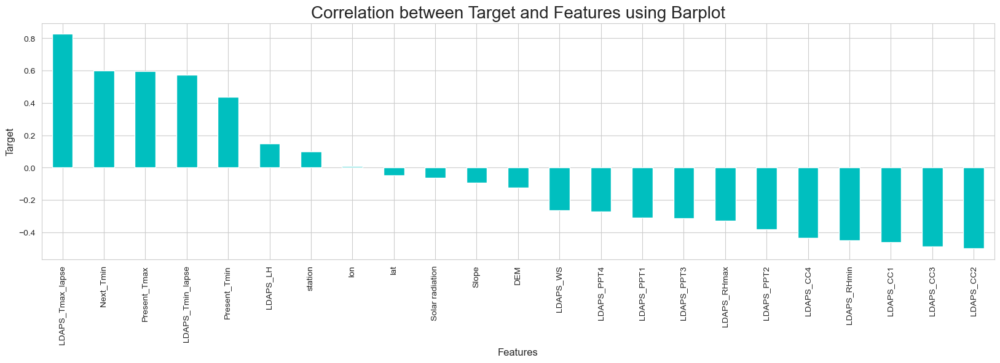

In [233]:
# barplot for the most correlated feature as well as least
plt.figure(figsize=(20,5))
new_df.corr()['Next_Tmax'].sort_values(ascending=False).drop(['Next_Tmax']).plot(kind='bar',color='c')
plt.xlabel('Features',fontsize=12)
plt.ylabel('Target',fontsize=12)
plt.title('Correlation between Target and Features using Barplot',fontsize=20)
plt.show()

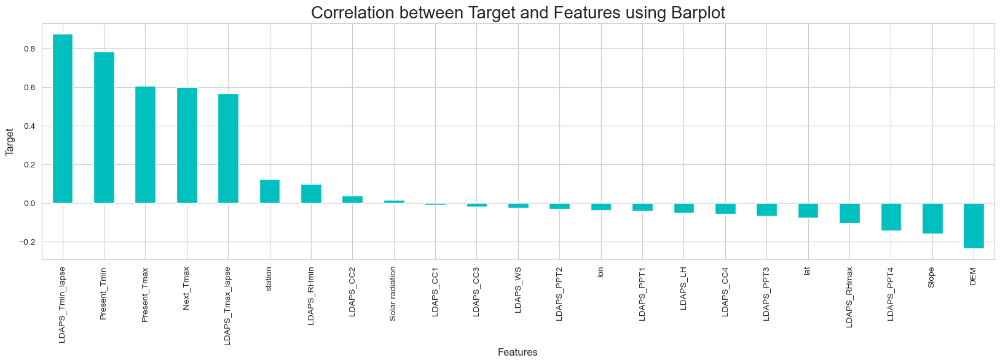

In [234]:
# barplot for the most correlated feature as well as least
plt.figure(figsize=(20,5))
new_df.corr()['Next_Tmin'].sort_values(ascending=False).drop(['Next_Tmin']).plot(kind='bar',color='c')
plt.xlabel('Features',fontsize=12)
plt.ylabel('Target',fontsize=12)
plt.title('Correlation between Target and Features using Barplot',fontsize=20)
plt.show()

For both the label latitude and longitude column is very less correlated. hence we can drop this column.

In [236]:
# dropping irrelavent column
new_df.drop(['lat', 'lon'], axis=1, inplace=True)
new_df.head().T

,0,1,2,3,4
station,1.000000,2.000000,3.000000,4.000000,5.000000
Present_Tmax,28.700000,31.900000,31.600000,32.000000,31.400000
Present_Tmin,21.400000,21.600000,23.300000,23.400000,21.900000
LDAPS_RHmin,58.255688,52.263397,48.690479,58.239788,56.174095
LDAPS_RHmax,0.271501,0.184890,-0.769141,1.309753,0.110434
LDAPS_Tmax_lapse,28.074101,29.850689,30.091292,29.704629,29.113934
LDAPS_Tmin_lapse,-0.311364,0.143619,0.392812,-0.173951,-0.103645
LDAPS_WS,0.097802,-0.619344,-0.309297,-0.650457,-0.587672
LDAPS_LH,0.318528,-0.201095,-1.380242,0.213209,1.292312
LDAPS_CC1,0.233947,0.225508,0.209344,0.216372,0.151407


Latitude column and longitude column has been dropped. 

In [237]:
# Separating the features and label
x = new_df.drop(['Next_Tmax', 'Next_Tmin'],axis=1)
y1 = new_df['Next_Tmax']
y2=new_df['Next_Tmin']

### Feature Scaling using Standard Scalarization

In [238]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope,Solar radiation
0,-1.666193,-0.375845,-0.805216,0.107371,0.272173,-0.562483,-0.343243,0.103377,0.325695,-0.511131,-0.586384,-0.530454,-0.574984,-0.558464,-0.519441,-0.489493,-0.442321,1.846834,1.319444,1.855060
1,-1.527672,0.720387,-0.718705,-0.305278,0.185350,0.057281,0.124021,-0.626988,-0.198938,-0.543372,-0.399756,-0.542932,-0.593838,-0.558464,-0.519441,-0.489493,-0.442321,0.063723,-0.381108,1.397473
2,-1.389152,0.617615,0.016639,-0.551320,-0.771013,0.141216,0.379939,-0.311225,-1.389455,-0.605127,-0.377543,-0.305445,-0.510092,-0.558464,-0.519441,-0.489493,-0.442321,-0.357834,-0.944678,1.377050
3,-1.250631,0.754644,0.059894,0.106276,1.312963,0.006328,-0.202121,-0.658674,0.219360,-0.578276,-0.500208,-0.533437,-0.555570,-0.558464,-0.519441,-0.489493,-0.442321,0.092692,1.240416,1.353765
4,-1.112110,0.549101,-0.588939,-0.035974,0.110712,-0.199736,-0.129918,-0.594731,1.308868,-0.826468,-0.406679,-0.436983,-0.355276,-0.558464,-0.519441,-0.489493,-0.442321,-0.283523,-0.397498,1.362894
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7477,1.104223,-2.294252,-2.362415,-2.204140,-1.379297,-0.653674,-2.036947,-0.020241,-1.984240,-1.202794,-1.263605,-1.589666,-1.439737,-0.558464,-0.519441,-0.489493,-0.442321,-0.715665,-0.275327,-1.760911
7478,1.242744,-2.499796,-2.535437,-1.831875,-0.805514,-1.040129,-2.174616,-0.570252,0.670964,-1.150994,-1.285631,-1.589661,-1.335862,-0.558464,-0.519441,-0.489493,-0.442321,-1.000809,-1.350009,-1.778134
7479,1.381265,-2.225738,-2.665203,-2.062811,-1.322661,-1.163211,-1.897420,-0.304125,0.398659,-1.290159,-1.065319,-1.589666,-1.474724,-0.558464,-0.519441,-0.489493,-0.442321,-1.574333,-1.275711,-1.776315
7480,1.519785,-2.225738,-2.405670,-2.248788,-1.465591,-0.933628,-1.910126,-0.056106,-0.351983,-1.267849,-1.088991,-1.589666,-1.474724,-0.558464,-0.519441,-0.489493,-0.442321,-1.396403,-1.068376,-1.782256


### Checking Multicolinearity

In [239]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["Features"] = x.columns
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]

vif

,Features,VIF values
0,station,1.212699
1,Present_Tmax,2.769819
2,Present_Tmin,3.015655
3,LDAPS_RHmin,6.324383
4,LDAPS_RHmax,2.557672
5,LDAPS_Tmax_lapse,6.539843
6,LDAPS_Tmin_lapse,6.482488
7,LDAPS_WS,1.241703
8,LDAPS_LH,1.501647
9,LDAPS_CC1,5.078255


Every feature are having vif value of less than 10. hence we do not need to drop those column.

## Modeling  for the prediction of Next_Tmax

### Finding the best random state

In [240]:
# importing libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor

In [241]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y1,test_size=0.30,random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train,y_train)
    pred = mod.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu,"at Random_state",maxRS)

Maximum r2 score is  0.9038618686457952 at Random_state 66


### Creating new train test split

In [242]:
x_train,x_test,y_train,y_test = train_test_split(x,y1,test_size=.30,random_state=maxRS)

### Regression Algorithms

In [243]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report
from sklearn import metrics

### RandomForestRegressor

In [244]:
# Checking R2 score for RandomForestRegressor
RFR = RandomForestRegressor()
RFR.fit(x_train,y_train)
predRFR = RFR.predict(x_test)
print("R2_Score:",r2_score(y_test,predRFR))
print("MAE:",metrics.mean_absolute_error(y_test,predRFR))
print("MSE:",metrics.mean_squared_error(y_test,predRFR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predRFR)))

R2_Score: 0.9009825543897989
MAE: 0.7440320712694873
MSE: 0.9504767661469924
RMSE: 0.9749239796758475


### DecisionTreeRegressor

In [245]:
# Checking R2 score for DecisionTreeRegressor
DTR = DecisionTreeRegressor()
DTR.fit(x_train,y_train)
predDTR = DTR.predict(x_test)
print("R2_Score:",r2_score(y_test,predDTR))
print("MAE:",metrics.mean_absolute_error(y_test,predDTR))
print("MSE:",metrics.mean_squared_error(y_test,predDTR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predDTR)))

R2_Score: 0.7504039838240375
MAE: 1.1115367483296215
MSE: 2.3958930957683746
RMSE: 1.5478672733049093


### KNeighbors Regressor

In [246]:
# Checking R2 score for KNN Regressor
knn = KNN()
knn.fit(x_train,y_train)
predknn = knn.predict(x_test)
print("R2_Score:",r2_score(y_test,predknn))
print("MAE:",metrics.mean_absolute_error(y_test,predknn))
print("MSE:",metrics.mean_squared_error(y_test,predknn))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,predknn)))

R2_Score: 0.8797342729754407
MAE: 0.8220668151447661
MSE: 1.1544408017817374
RMSE: 1.0744490689566153


### GradientBoosting Regressor

In [247]:
# Checking R2 score for GradientBoosting Regressor
GB = GradientBoostingRegressor()
GB.fit(x_train,y_train)
predGB = GB.predict(x_test)
print("R2_Score:",r2_score(y_test,predGB))
print("MAE:",metrics.mean_absolute_error(y_test,predGB))
print("MSE:",metrics.mean_squared_error(y_test,predGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,predGB)))

R2_Score: 0.8495953062590902
MAE: 0.9274468442463171
MSE: 1.443747271394578
RMSE: 1.2015603486278075


### BaggingRegressor

In [248]:
# Checking R2 score for BaggingRegressor
BR = BaggingRegressor()
BR.fit(x_train,y_train)
predBR = BR.predict(x_test)
print("R2_Score:",r2_score(y_test,predBR))
print("MAE:",metrics.mean_absolute_error(y_test,predBR))
print("MSE:",metrics.mean_squared_error(y_test,predBR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,predBR)))

R2_Score: 0.8908741862690267
MAE: 0.7808240534521159
MSE: 1.0475078396436526
RMSE: 1.023478304432318


## Checking the cross validation score

In [250]:
from sklearn.model_selection import cross_val_score
# Checking cv score for RandomForestRegressor
print(cross_val_score(RFR,x,y1,cv=5).mean())

0.6813930889849189


In [251]:
# Checking cv score for DecisionTreeRegressor
print(cross_val_score(DTR,x,y1,cv=5).mean())

0.41669584852861236


In [252]:
# Checking cv score for KNN Regressor
print(cross_val_score(knn,x,y1,cv=5).mean())

0.5518505871262549


In [253]:
# Checking cv score for Gradient Boosting Regressor
print(cross_val_score(GB,x,y1,cv=5).mean())

0.7068895745490436


In [254]:
# Checking cv score for Bagging Regressor
print(cross_val_score(BR,x,y1,cv=5).mean())

0.6588592495260833


The difference between cross valiation score and the r2 score is 
* for Randomforest Regressor =21.96
* for DecisionTreeRegressor = 33.38
* for KNNRegressor =32.79
* for GradientBoostingRegressor= 14.27
* for BaggingRegressor= 23.2

From all of the difference we will select the model which have the least difference value between cross validation score and r2 score. hare we will go with the model GradientBoostingRegressor.

## Hyper parameter tuning

In [264]:
from sklearn.model_selection import RandomizedSearchCV
# Gradient Boosting Regressor
parameters = {'min_samples_leaf':[1,2,3,4,5],
              'max_features':['sqrt', 'log2'],
              'n_estimators':[200,400,600],
              'max_depth':[2,5,10]}

In [265]:
RCV=RandomizedSearchCV(GradientBoostingRegressor(),parameters,cv=10)
RCV.fit(x_train,y_train)

RandomizedSearchCV(cv=10, estimator=GradientBoostingRegressor(),
                   param_distributions={'max_depth': [2, 5, 10],
                                        'max_features': ['sqrt', 'log2'],
                                        'min_samples_leaf': [1, 2, 3, 4, 5],
                                        'n_estimators': [200, 400, 600]})

In [266]:
RCV.best_params_

{'n_estimators': 400,
 'min_samples_leaf': 5,
 'max_features': 'sqrt',
 'max_depth': 10}

In [268]:
final_Next_Tmax = GradientBoostingRegressor(criterion='mae', max_depth=10, max_features='sqrt', min_samples_leaf= 5, n_estimators=400)
final_Next_Tmax.fit(x_train, y_train)
pred = final_Next_Tmax.predict(x_test)
print("RMSE value:",np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('R2_Score:',r2_score(y_test,pred)*100)

RMSE value: 0.8312976999429719
R2_Score: 92.80081438541981


Model performance has been improved from 84% to 92% in this gradient boosting regressor.

## Saving the model for Next_Tmax

In [269]:
import joblib
joblib.dump(final_Next_Tmax,"Next_Tmax_Prediction.pkl")

['Next_Tmax_Prediction.pkl']

In [270]:
# loading the model
model = joblib.load("Next_Tmax_Prediction.pkl")

# looking the model performance
a = np.array(y_test)
predicted = np.array(model.predict(x_test))
df_new = pd.DataFrame({"Original":a,"Predicted":predicted},index= range(len(a)))
df_new

,Original,Predicted
0,25.8,25.222000
1,31.1,32.397722
2,36.3,35.256372
3,28.0,27.990680
4,34.2,32.973799
...,...,...
2240,29.3,30.334825
2241,24.5,26.324511
2242,32.5,32.544490
2243,32.4,33.063356


## Modeling  for the prediction of Next_Tmin

In [271]:
# Finding the best random state
maxAccu=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y2,test_size=0.30,random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train,y_train)
    pred = mod.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu,"at Random_state",maxRS)

Maximum r2 score is  0.9068132584134623 at Random_state 31


### Creating new train test split

In [272]:
x_train,x_test,y_train,y_test = train_test_split(x,y2,test_size=.30,random_state=maxRS)

### RandomForestRegressor

In [273]:
# Checking R2 score for RandomForestRegressor
RFR = RandomForestRegressor()
RFR.fit(x_train,y_train)
predRFR = RFR.predict(x_test)
print("R2_Score:",r2_score(y_test,predRFR))
print("MAE:",metrics.mean_absolute_error(y_test,predRFR))
print("MSE:",metrics.mean_squared_error(y_test,predRFR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predRFR)))

R2_Score: 0.9060669270697856
MAE: 0.56238574610245
MSE: 0.5410604498886412
RMSE: 0.7355681136975971


### DecisionTreeRegressor

In [274]:
# Checking R2 score for DecisionTreeRegressor
DTR = DecisionTreeRegressor()
DTR.fit(x_train,y_train)
predDTR = DTR.predict(x_test)
print("R2_Score:",r2_score(y_test,predDTR))
print("MAE:",metrics.mean_absolute_error(y_test,predDTR))
print("MSE:",metrics.mean_squared_error(y_test,predDTR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predDTR)))

R2_Score: 0.7729307635290282
MAE: 0.8402227171492206
MSE: 1.307933184855234
RMSE: 1.1436490654283917


### KNN Regressor

In [275]:
# Checking R2 score for KNN Regressor
knn = KNN()
knn.fit(x_train,y_train)
predknn = knn.predict(x_test)
print("R2_Score:",r2_score(y_test,predknn))
print("MAE:",metrics.mean_absolute_error(y_test,predknn))
print("MSE:",metrics.mean_squared_error(y_test,predknn))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,predknn)))

R2_Score: 0.8730336592636575
MAE: 0.6621915367483295
MSE: 0.7313341648106905
RMSE: 0.8551807790231785


### GradientBoosting Regressor

In [276]:
# Checking R2 score for GradientBoosting Regressor
GB = GradientBoostingRegressor()
GB.fit(x_train,y_train)
predGB = GB.predict(x_test)
print("R2_Score:",r2_score(y_test,predGB))
print("MAE:",metrics.mean_absolute_error(y_test,predGB))
print("MSE:",metrics.mean_squared_error(y_test,predGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,predGB)))

R2_Score: 0.8858883804609552
MAE: 0.6327101198516861
MSE: 0.6572901564839307
RMSE: 0.8107343316302392


### BaggingRegressor

In [277]:
# Checking R2 score for BaggingRegressor
BR = BaggingRegressor()
BR.fit(x_train,y_train)
predBR = BR.predict(x_test)
print("R2_Score:",r2_score(y_test,predBR))
print("MAE:",metrics.mean_absolute_error(y_test,predBR))
print("MSE:",metrics.mean_squared_error(y_test,predBR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,predBR)))

R2_Score: 0.8892828232516589
MAE: 0.611924276169265
MSE: 0.637737951002227
RMSE: 0.7985849679290407


## Checking the cross validation score

In [278]:
# Checking cv score for RandomForestRegressor
print(cross_val_score(RFR,x,y1,cv=5).mean())

0.6797990296985599


In [279]:
# Checking cv score for DecisionTreeRegressor
print(cross_val_score(DTR,x,y1,cv=5).mean())

0.4047010228438063


In [280]:
# Checking cv score for KNN Regressor
print(cross_val_score(knn,x,y1,cv=5).mean())

0.5518505871262549


In [281]:
# Checking cv score for Gradient Boosting Regressor
print(cross_val_score(GB,x,y1,cv=5).mean())

0.7069646542022253


In [282]:
# Checking cv score for Bagging Regressor
print(cross_val_score(BR,x,y1,cv=5).mean())

0.657983369497845


The difference between cross valiation score and the r2 score is

* for Randomforest Regressor =22.63
* for DecisionTreeRegressor = 36.82
* for KNNRegressor =32.72
* for GradientBoostingRegressor= 17.89
* for BaggingRegressor= 23.13

From all of the difference we will select the model which have the least difference value between cross validation score and r2 score. hare we will go with the model GradientBoostingRegressor.

## Hyper parameter tuning

In [283]:
from sklearn.model_selection import RandomizedSearchCV
# Gradient Boosting Regressor
parameters = {'min_samples_leaf':[1,3,5],
              'max_features':['sqrt', 'log2'],
              'n_estimators':[200,400,600],
              'max_depth':[4,6,8,10]}

In [284]:
RCV=RandomizedSearchCV(GradientBoostingRegressor(),parameters,cv=10)
RCV.fit(x_train,y_train)

RandomizedSearchCV(cv=10, estimator=GradientBoostingRegressor(),
                   param_distributions={'max_depth': [4, 6, 8, 10],
                                        'max_features': ['sqrt', 'log2'],
                                        'min_samples_leaf': [1, 3, 5],
                                        'n_estimators': [200, 400, 600]})

In [286]:
RCV.best_params_

{'n_estimators': 600,
 'min_samples_leaf': 5,
 'max_features': 'log2',
 'max_depth': 6}

In [287]:
final_Next_Tmin = GradientBoostingRegressor(criterion='mae', 
                                     max_depth=6,
                                     max_features='log2',
                                     min_samples_leaf= 5,
                                     n_estimators=600)
final_Next_Tmin.fit(x_train, y_train)
pred = final_Next_Tmin.predict(x_test)
print("RMSE value:",np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('R2_Score:',r2_score(y_test,pred)*100)

RMSE value: 0.6142859311471176
R2_Score: 93.4489052833458


## Saving the model for Next_Tmin

In [289]:
joblib.dump(final_Next_Tmin,"Next_Tmin_Prediction.pkl")
# loading the model
model = joblib.load("Next_Tmin_Prediction.pkl")

# looking the model performance
a = np.array(y_test)
predicted = np.array(model.predict(x_test))
df_new = pd.DataFrame({"Original":a,"Predicted":predicted},index= range(len(a)))
df_new

,Original,Predicted
0,20.5,20.327858
1,20.5,21.002344
2,22.3,23.065428
3,23.5,23.488184
4,27.3,26.721331
...,...,...
2240,20.1,20.188401
2241,22.2,22.480940
2242,22.7,22.754534
2243,22.6,21.933500


Predicted is close ti the original value hence model performs well.